# Installing and importing libraries

In [1]:
!pip install datasets -q
from datasets import load_dataset
import numpy as np
from numpy import linalg as la
import matplotlib.pyplot as plt
import random
import math
from scipy.spatial import Voronoi, voronoi_plot_2d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 KB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 KB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 KB 21.6 MB/s eta 0:00:00


In [2]:
np.random.seed(58)
random.seed(58)

# Installing dataset

In [ ]:
mnist = load_dataset('mnist')

train_dataset = mnist['train']
test_dataset = mnist['test']

# access the features and labels
train_images = train_dataset['image']
train_labels = train_dataset['label']

test_images = test_dataset['image']
test_labels = test_dataset['label']

Extracting data files:   0%|          | 0/4 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/60000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Dataset mnist downloaded and prepared to /root/.cache/huggingface/datasets/mnist/mnist/1.0.0/fda16c03c4ecfb13f165ba7e29cf38129ce035011519968cdaf74894ce91c9d4. Subsequent calls will reuse this data.


  0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
Images=[]
for i in train_images:
  Images.append(np.array(i).reshape(-1))
Images=np.array(Images)

In [ ]:
Images.shape # this is of the shape NxDx1 we want to make it DxN so we squeeze and take a transpose

(60000, 784)

In [ ]:
Images=Images.T #to remove the extra 1 at end in shape

In [ ]:
Images.shape

(784, 60000)

# PCA

**1(i)**

In [ ]:
def normalization(data):
  """
  centers the data around mean
  """
  data=(data/255.0).astype(np.float16) # to normalise values between 0 and 1
  data_centered=data-np.repeat(data.mean(axis=1).reshape(-1,1),repeats=data.shape[1],axis=1)
  return data_centered
def PCA(data,k=None,var=None):
  """
  This performs PCA on given data. Data is first normalised and then the principle compnenets are calculated.
  By default if we do PCA(data) we get top 50 eigen vectors. The number of eigen vectors needed can be chaged as PCA(data,k=n) where n is the number of components we want.
  To get components that explain some percentage of varience PCA(data,var=num) where num is float between 0 and 1.
  Returns: 
  top_k_eigenValues,top_k_eigenvectors,k,explained_varience
  Args:
  data: numpy 2D array of shape (DxN)
  k: numper of principal components needed
  var: minimum percentage of varience to be explained
  """
  #lets do a normalization of the array and mean centering of the data
  data_centered=normalization(data)

  #lets calculate the covariance matrix which is nothing but X * Xt
  #covData=np.dot(data_centered,data_centered.T)/data_centered.shape[1]
  #np.cov was working faster than np.dot()
  covData=np.cov(data_centered) 
  
  #computing the eigen values
  eigVal,eigVector=la.eig(covData)  

  #sorting the eigen values and vectors in decending order of eigen values
  sortedIndices=eigVal.argsort()[::-1]
  eigenValsSorted=eigVal[sortedIndices]
  eigenVectorsSorted=eigVector[:,sortedIndices]

  #if k is mentioned then we take k top eigen values and corresponding vectors
  if k!=None:
    top_k_eigenValues=eigenValsSorted[:k]
    top_k_eigenvectors=eigenVectorsSorted[:,:k]

    explained_varience=top_k_eigenValues.sum()/eigVal.sum()
    return top_k_eigenValues,top_k_eigenvectors,k,explained_varience
  if var!=None:
    s=0
    k=0
    den=eigVal.sum()
    for i in eigenValsSorted:
      s+=(i/den)
      k+=1
      if(s>=var):
        break
    top_k_eigenValues=eigenValsSorted[:k]
    top_k_eigenvectors=eigenVectorsSorted[:,:k]

    explained_varience=top_k_eigenValues.sum()/eigVal.sum()
    return top_k_eigenValues,top_k_eigenvectors,k,explained_varience
  

In [ ]:
top_k_eigenValues,top_k_eigenvectors,k,explained_varience = PCA(Images,k=100)
explained_varience

0.9146297571768353

In [ ]:
img=Images[:,0].reshape(-1,1)

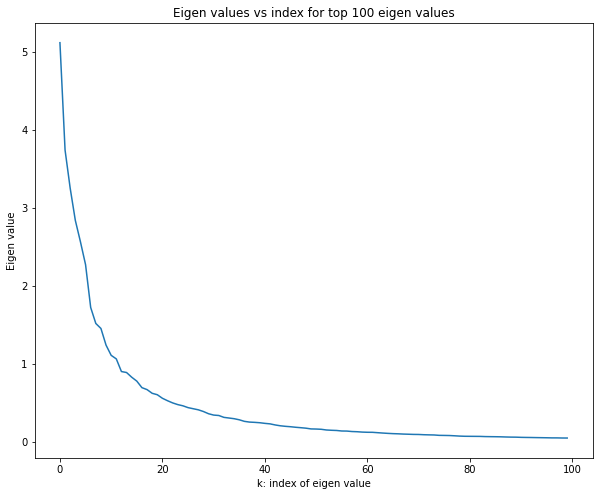

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(top_k_eigenValues)
plt.xlabel('k: index of eigen value')
plt.ylabel('Eigen value')
plt.title('Eigen values vs index for top 100 eigen values')
plt.show()

In [ ]:
# To get all eigen values and to plot them
eigenValues,eigenvectors,k,explained_varience = PCA(Images,k=784,var=None)

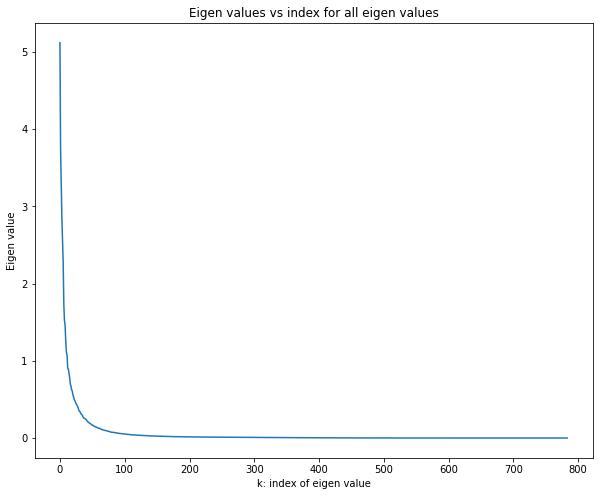

In [ ]:
plt.figure(figsize=(10,8))
plt.plot(eigenValues)
plt.xlabel('k: index of eigen value')
plt.ylabel('Eigen value')
plt.title('Eigen values vs index for all eigen values')
plt.show()

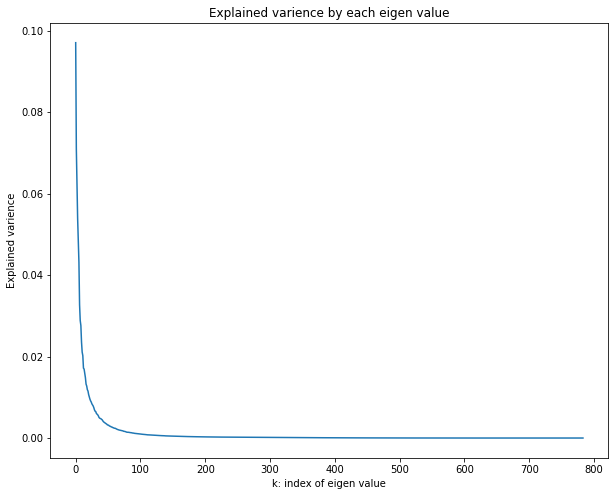

In [ ]:
explained_variences=eigenValues/eigenValues.sum()
plt.figure(figsize=(10,8))
plt.plot(explained_variences)
plt.xlabel('k: index of eigen value')
plt.ylabel('Explained varience')
plt.title('Explained varience by each eigen value')
plt.show()

In [ ]:
#the explained variences of each of the component
print(explained_variences)

[ 9.70457318e-02  7.09584234e-02  6.16921625e-02  5.38957332e-02
  4.86875158e-02  4.31218167e-02  3.27202897e-02  2.88385776e-02
  2.76198237e-02  2.35698882e-02  2.10920723e-02  2.02296522e-02
  1.71579831e-02  1.69213766e-02  1.57866988e-02  1.48295918e-02
  1.32456701e-02  1.27690628e-02  1.18726800e-02  1.15263853e-02
  1.06618405e-02  1.00667830e-02  9.53589006e-03  9.12536043e-03
  8.83423329e-03  8.39353108e-03  8.12574372e-03  7.86342407e-03
  7.44730589e-03  6.90870115e-03  6.58088340e-03  6.48142951e-03
  6.02601546e-03  5.86606261e-03  5.70033267e-03  5.43624092e-03
  5.05772952e-03  4.87859875e-03  4.81438352e-03  4.72262124e-03
  4.56738094e-03  4.44820055e-03  4.18506946e-03  3.98220396e-03
  3.84979837e-03  3.75105554e-03  3.62012715e-03  3.51591101e-03
  3.40065267e-03  3.21879465e-03  3.19016192e-03  3.12801284e-03
  2.95995603e-03  2.88955971e-03  2.84130576e-03  2.71437674e-03
  2.69523896e-03  2.58471346e-03  2.53765451e-03  2.44784771e-03
  2.40504677e-03  2.39264

The negative eigen values that are evident at the end are due to floating point errors i assume. Because the matrix is PSD and should not and will not have any negative eigen values and hence no negative varience explained values.

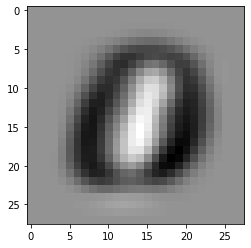

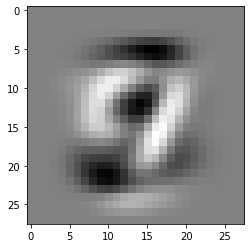

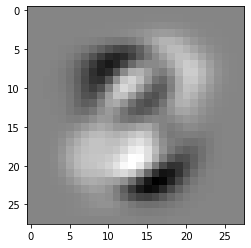

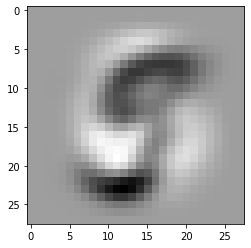

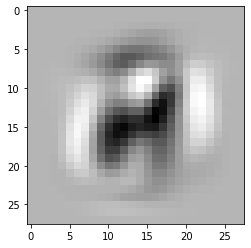

...

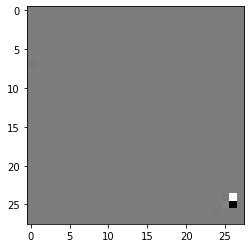

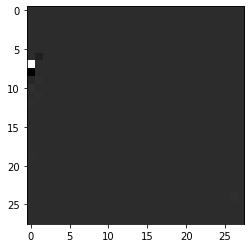

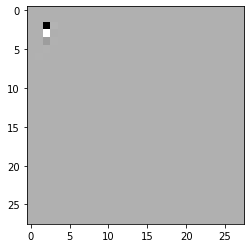

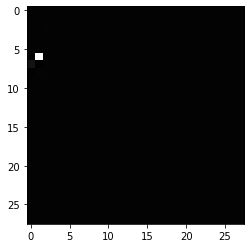

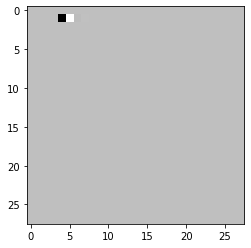

In [ ]:
#visualization of how the principal vectors look
for i in range(eigenvectors.shape[1]):
  plt.imshow(eigenvectors[:,i].reshape(28,28),cmap='gray')
  plt.show()

The last few princial components prbably belong to noise in data as they do not expalain any useful information about the images in the dataset

**1(ii)**

*Image reconstruction*

In [ ]:
Images_centered=normalization(Images)
image=Images_centered[:,0].reshape(-1,1)
reconImage=((image.T).dot(top_k_eigenvectors)).dot(top_k_eigenvectors.T)

In [ ]:
test_images=[]
for i in train_images:
  test_images.append(np.array(i).reshape(-1))
test_images=np.array(test_images).T

In [ ]:
mean=test_images.mean(axis=1)

In [ ]:
test_images=normalization(test_images)

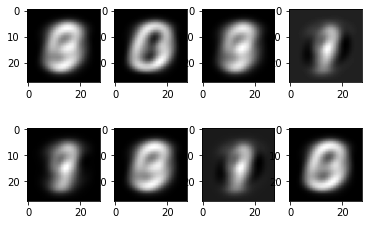

for dimensions: 1 explained varience: 0.09704573178200489 


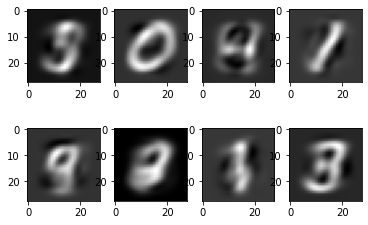

for dimensions: 11 explained varience: 0.5092420350327325 


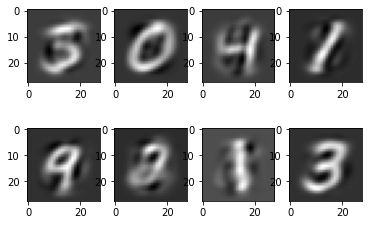

for dimensions: 21 explained varience: 0.6542429760740383 


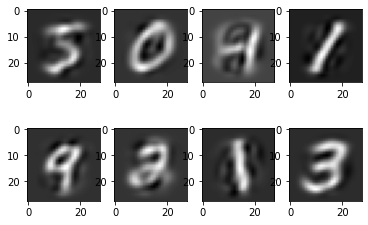

for dimensions: 31 explained varience: 0.7371248321937759 


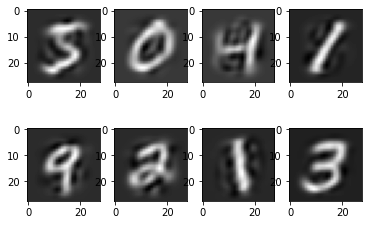

for dimensions: 41 explained varience: 0.7906756273268749 


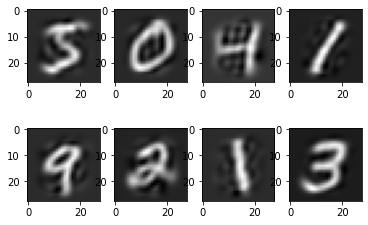

for dimensions: 51 explained varience: 0.8278376026007194 


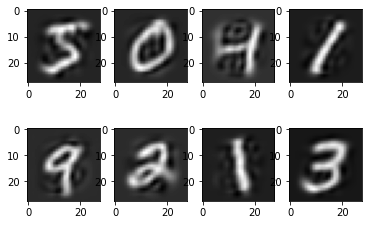

for dimensions: 61 explained varience: 0.855041315084147 


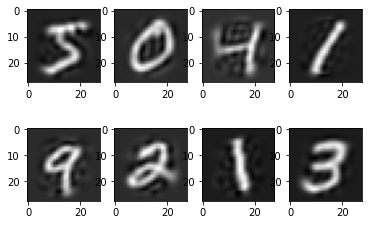

for dimensions: 71 explained varience: 0.875845826792399 


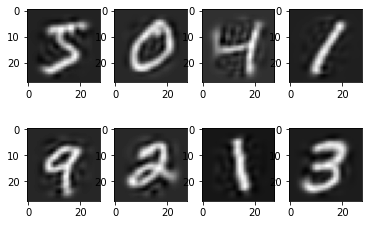

for dimensions: 81 explained varience: 0.8919725752202765 


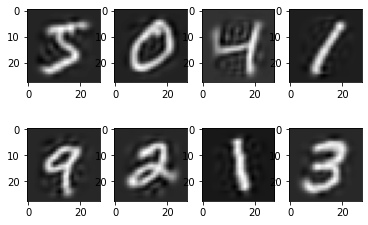

for dimensions: 91 explained varience: 0.904980480117831 


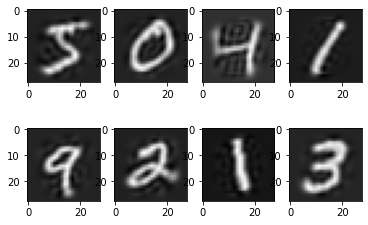

for dimensions: 101 explained varience: 0.9156137633302069 


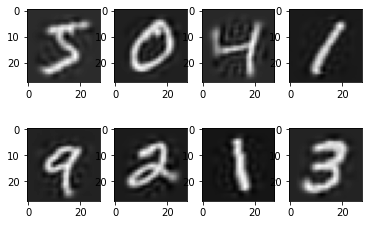

for dimensions: 111 explained varience: 0.92440606483312 


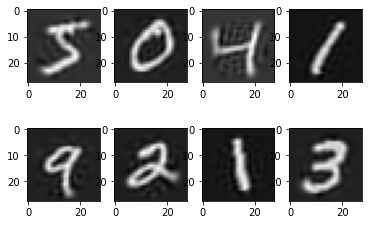

for dimensions: 121 explained varience: 0.9318484078942673 


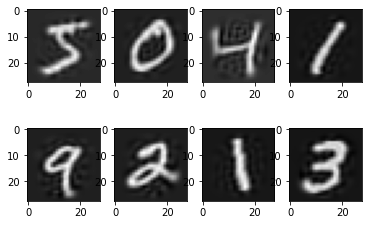

for dimensions: 131 explained varience: 0.9383091725305345 


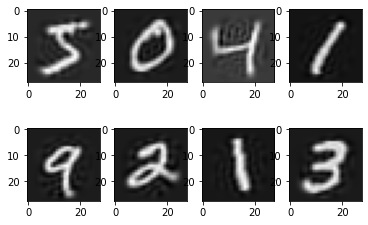

for dimensions: 141 explained varience: 0.9439429899298494 


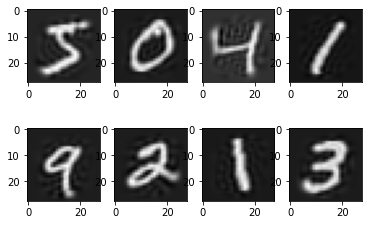

for dimensions: 151 explained varience: 0.9488244098566987 


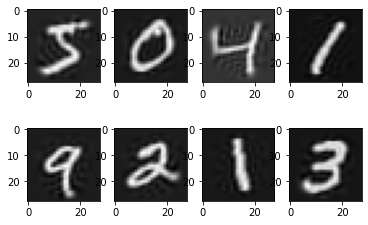

for dimensions: 161 explained varience: 0.9532155292935979 


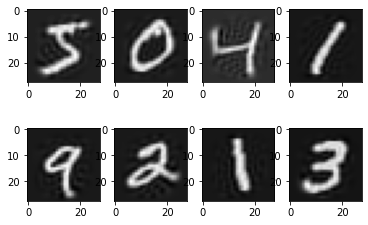

for dimensions: 171 explained varience: 0.9570963120668806 


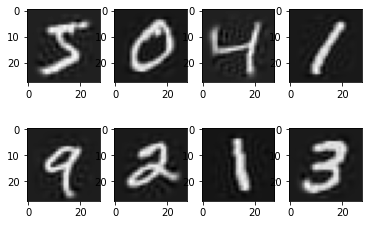

for dimensions: 181 explained varience: 0.9606020744951599 


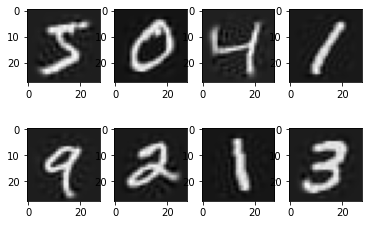

for dimensions: 191 explained varience: 0.9637906459742863 


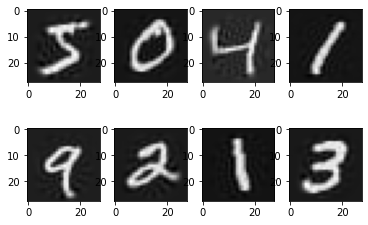

for dimensions: 201 explained varience: 0.9667305086336642 


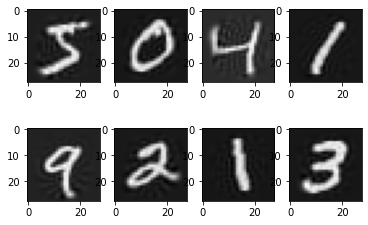

for dimensions: 211 explained varience: 0.9694042263334665 


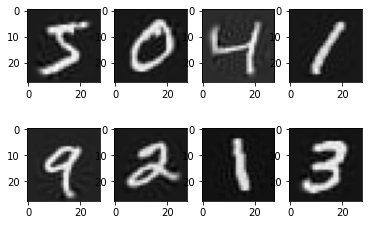

for dimensions: 221 explained varience: 0.9718918651059404 


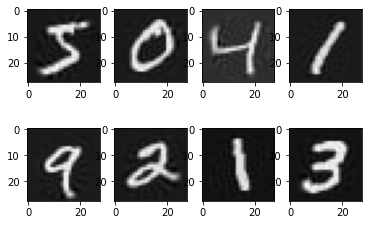

for dimensions: 231 explained varience: 0.9742017101380991 


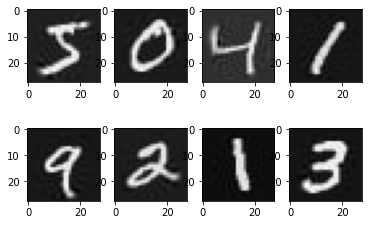

for dimensions: 241 explained varience: 0.9763306512391584 


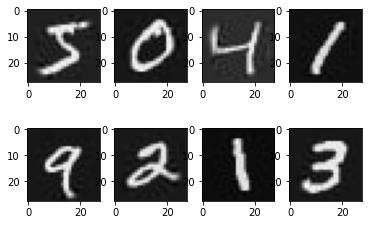

for dimensions: 251 explained varience: 0.9782995268706036 


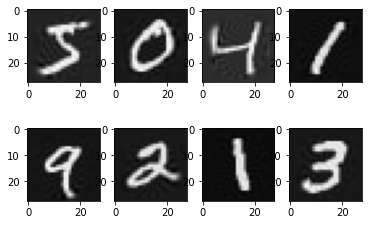

for dimensions: 261 explained varience: 0.9801395655768781 


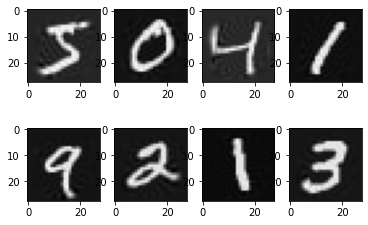

for dimensions: 271 explained varience: 0.9818577769546335 


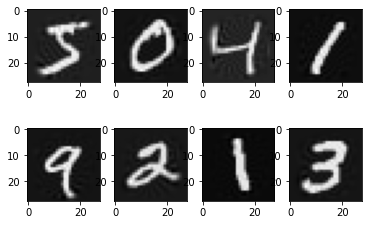

for dimensions: 281 explained varience: 0.9834700628459748 


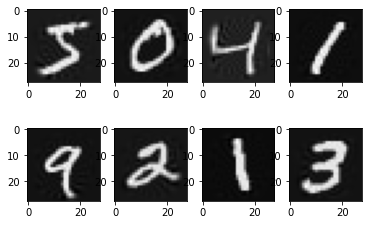

for dimensions: 291 explained varience: 0.9849702034831567 


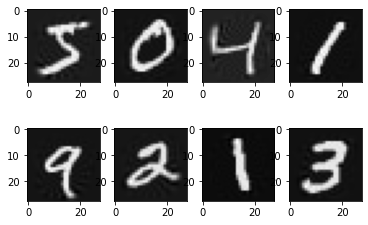

for dimensions: 301 explained varience: 0.9863652292313723 


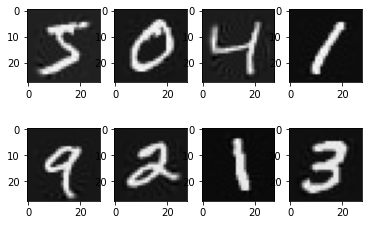

for dimensions: 311 explained varience: 0.9876649016106442 


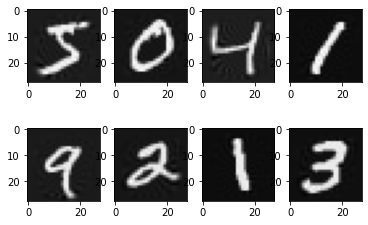

for dimensions: 321 explained varience: 0.9888804479022129 


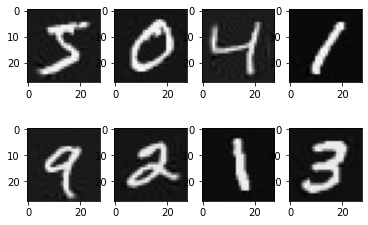

for dimensions: 331 explained varience: 0.990013500524729 


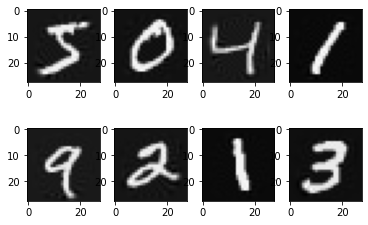

for dimensions: 341 explained varience: 0.991070234893266 


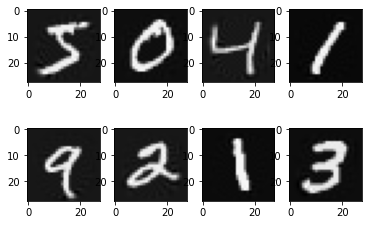

for dimensions: 351 explained varience: 0.9920466841833769 


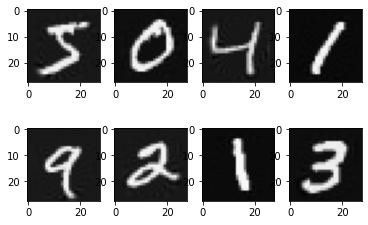

for dimensions: 361 explained varience: 0.9929506897986705 


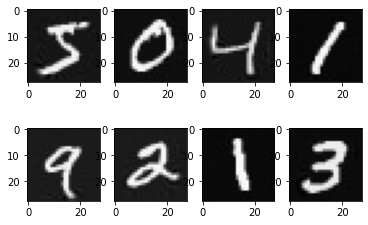

for dimensions: 371 explained varience: 0.9937850024624124 


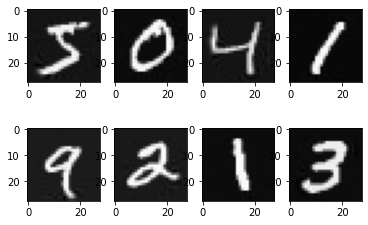

for dimensions: 381 explained varience: 0.9945525500117101 


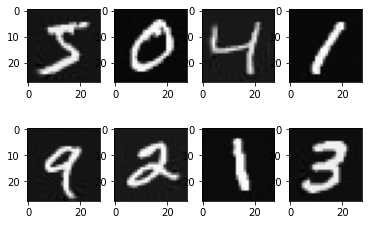

for dimensions: 391 explained varience: 0.9952545223851906 


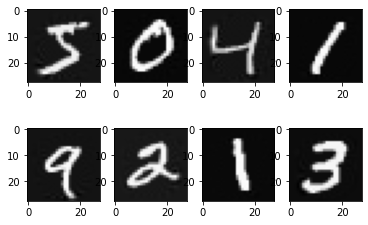

for dimensions: 401 explained varience: 0.9958802694831053 


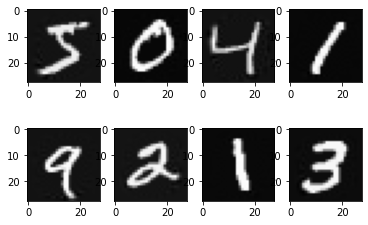

for dimensions: 411 explained varience: 0.9964411396318973 


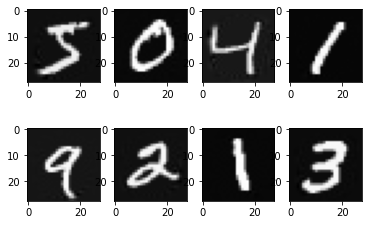

for dimensions: 421 explained varience: 0.9969473251304382 


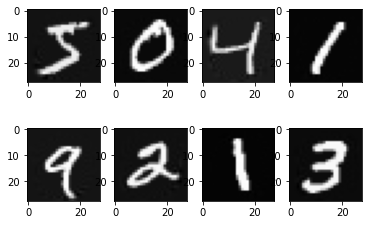

for dimensions: 431 explained varience: 0.9973919397620273 


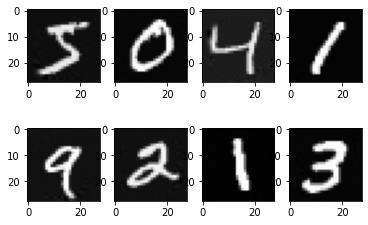

for dimensions: 441 explained varience: 0.9977834865973885 


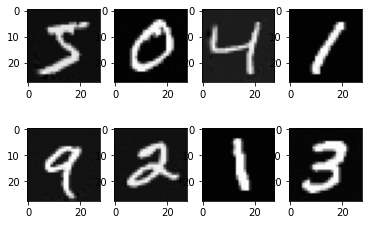

for dimensions: 451 explained varience: 0.998128844448155 


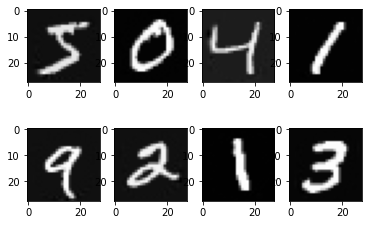

for dimensions: 461 explained varience: 0.9984285511653381 


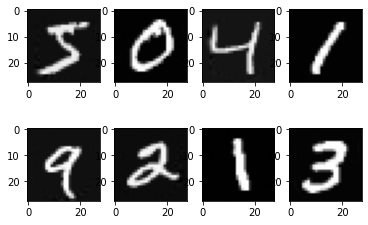

for dimensions: 471 explained varience: 0.9986853259916195 


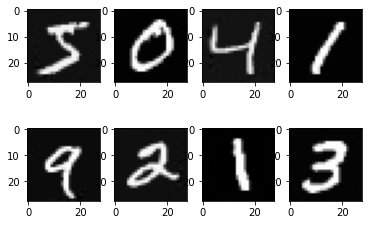

for dimensions: 481 explained varience: 0.9989106533133054 


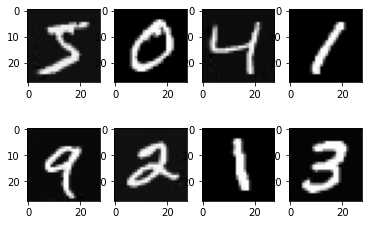

for dimensions: 491 explained varience: 0.9991046649821533 


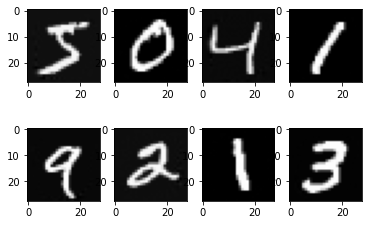

for dimensions: 501 explained varience: 0.9992680648969936 


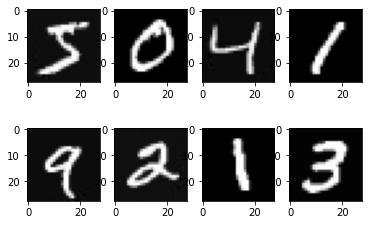

for dimensions: 511 explained varience: 0.999408771750324 


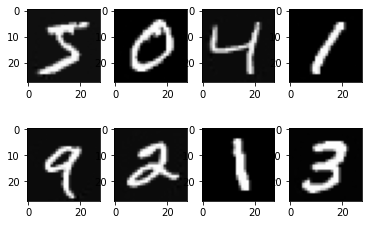

for dimensions: 521 explained varience: 0.999527243686454 


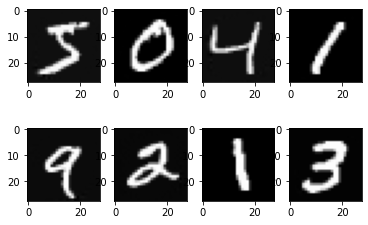

for dimensions: 531 explained varience: 0.999627964470356 


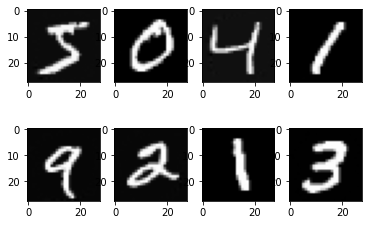

for dimensions: 541 explained varience: 0.9997087177169396 


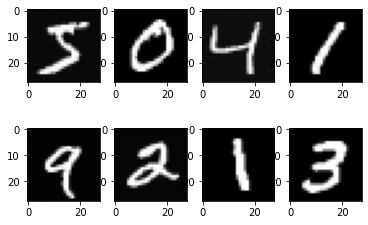

for dimensions: 551 explained varience: 0.9997768596603935 


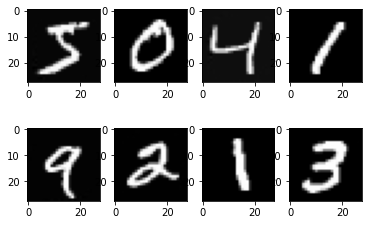

for dimensions: 561 explained varience: 0.9998305108976012 


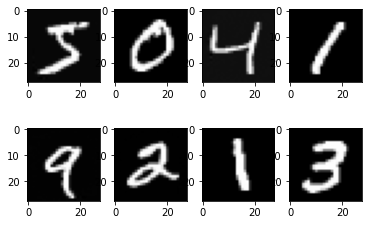

for dimensions: 571 explained varience: 0.9998744324566087 


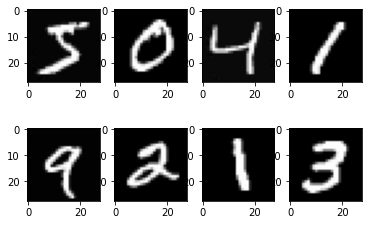

for dimensions: 581 explained varience: 0.9999071870547629 


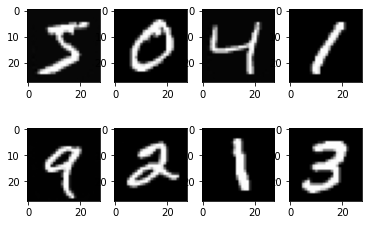

for dimensions: 591 explained varience: 0.9999332047859474 


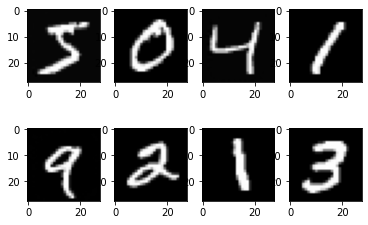

for dimensions: 601 explained varience: 0.9999530958861312 


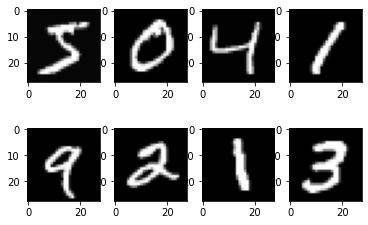

for dimensions: 611 explained varience: 0.9999677449031968 


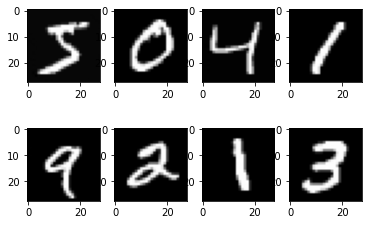

for dimensions: 621 explained varience: 0.9999781124392904 


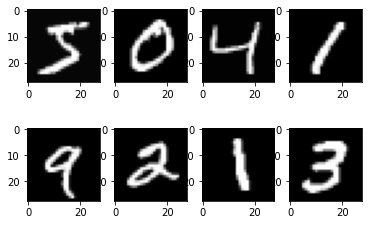

for dimensions: 631 explained varience: 0.9999858358382397 


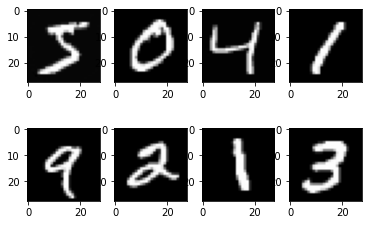

for dimensions: 641 explained varience: 0.9999913886489569 


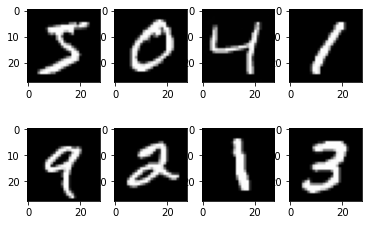

for dimensions: 651 explained varience: 0.9999951047834582 


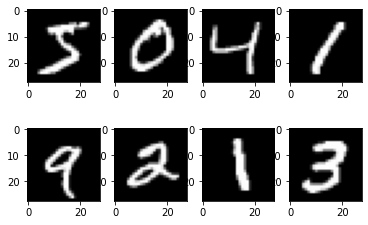

for dimensions: 661 explained varience: 0.999997441914774 


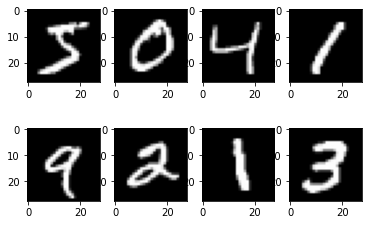

for dimensions: 671 explained varience: 0.9999988884272564 


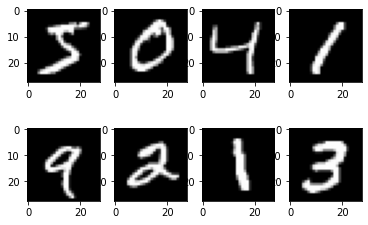

for dimensions: 681 explained varience: 0.9999995487029654 


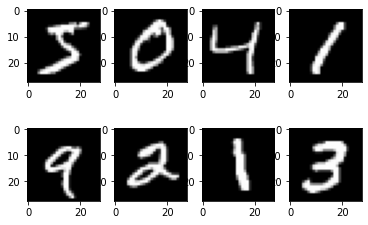

for dimensions: 691 explained varience: 0.999999865621812 


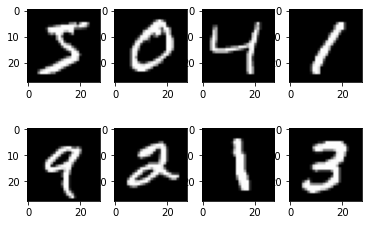

for dimensions: 701 explained varience: 0.9999999781656569 


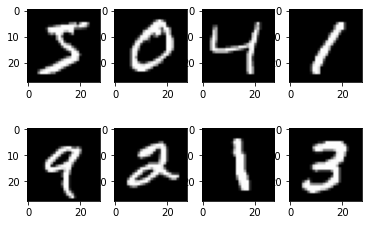

for dimensions: 711 explained varience: 0.9999999999846996 


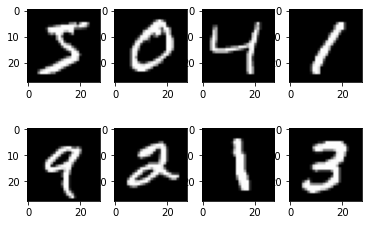

for dimensions: 721 explained varience: 1.0 


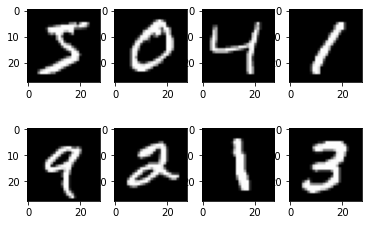

for dimensions: 731 explained varience: 1.0 


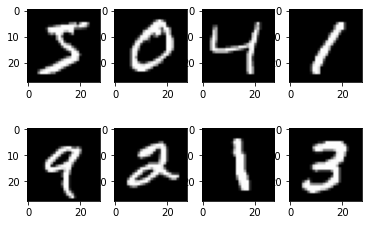

for dimensions: 741 explained varience: 1.0 


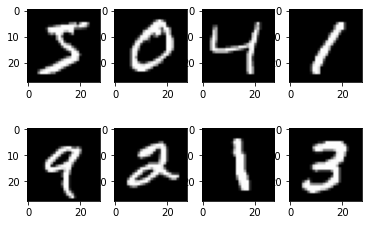

for dimensions: 751 explained varience: 1.0 


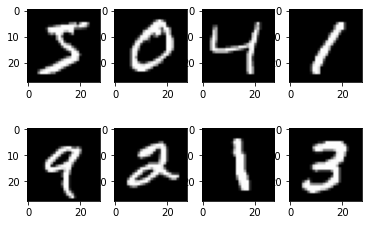

for dimensions: 761 explained varience: 1.0 


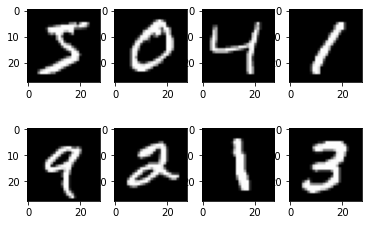

for dimensions: 771 explained varience: 1.0 


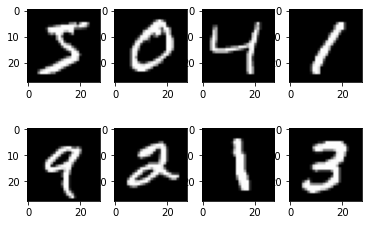

for dimensions: 781 explained varience: 1.0 


In [ ]:
#lets try plotting the reconstrucnted image, explained variance for different values of d
images=np.array(test_images[:,:8]).reshape(-1,8) # taking an images that was not used in computing principal components
den=eigenValues.sum()
for d in range(1,Images.shape[0],10):
  top_k_eigenvectors=eigenvectors[:,:d]
  #during reconstruction did demormalization of output image 
  reconImages=(top_k_eigenvectors @ top_k_eigenvectors.T).dot(images).reshape(28,28,8)*255
  plt.figure()
  for i in range(1,9):
    plt.subplot(2,4,i)
    plt.imshow(reconImages[:,:,i-1] + mean.reshape(28,28),cmap='gray')
  plt.show()
  #plt.imshow(reconImage,cmap='gray')
  #plt.show()
  print(f'for dimensions: {d} explained varience: {eigenValues[:d].sum()/den} ')

In [ ]:
#from the above plots of reconstructed images and explained variences for different dimensions
#we can see that a clear image of the number starts to form around 80% of explaing the varience 
#but as a rule of thumb one would want to explain 95% of the data with principal components
#any varience of above 80% would still work but we will use d for which we can explain 95% of data
top_k_eigenValues,top_k_eigenvectors,k,explained_varience = PCA(Images,var=0.95) 
print("Number of dimensions needed to explain 95% of data:",k)

Number of dimensions needed to explain 95% of data: 154


**1(iii)**

#Kernel - PCA

In [ ]:
def XTX(data):
  return np.matmul(data.T,data)
def kernel_1(XTX,i,j,d):
  return (XTX[i][j]+1.)**d
def kernel_2(XTX,i,j,sig):
  return np.exp(-((XTX[i][i]-2.*XTX[i][j]+XTX[j][j])/(2.*sig**2)))
def compute_K(XTX,kernel,param):
  N,N=XTX.shape
  K=np.zeros(shape=(N,N))
  for i in range(N):
    for j in range(i,N):
      prod=kernel(XTX,i,j,param)
      K[i][j]=prod
      K[j][i]=prod
  return K
def center_K(K):
  N,N=K.shape
  ones=np.ones((N,N)) / N
  #efficient way of writing centering
  K_centered=K-ones.dot(K)-K.dot(ones)-ones.dot(K).dot(ones)
  return K_centered
def kernelPCA(XTX,kernel,param):
  K=compute_K(XTX,kernel,param)
  K_center=center_K(K)
  eigVal,eigVec=la.eig(K_center)
  sortedIndices=eigVal.argsort()[::-1]
  eigenValsSorted=eigVal[sortedIndices]
  eigenVectorsSorted=eigVec[:,sortedIndices]
  return eigenValsSorted,eigenVectorsSorted,K_center

In [ ]:
xtx=XTX(Images[:,:2000]/255.)
xtx.shape

(2000, 2000)

In [ ]:
c=train_labels[:2000]

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

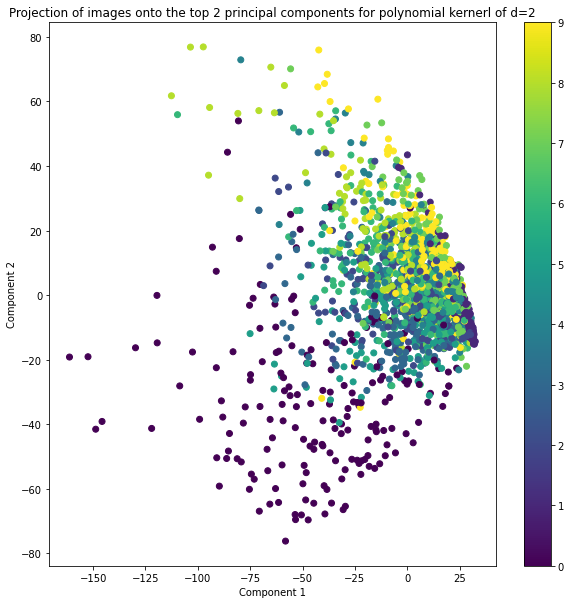

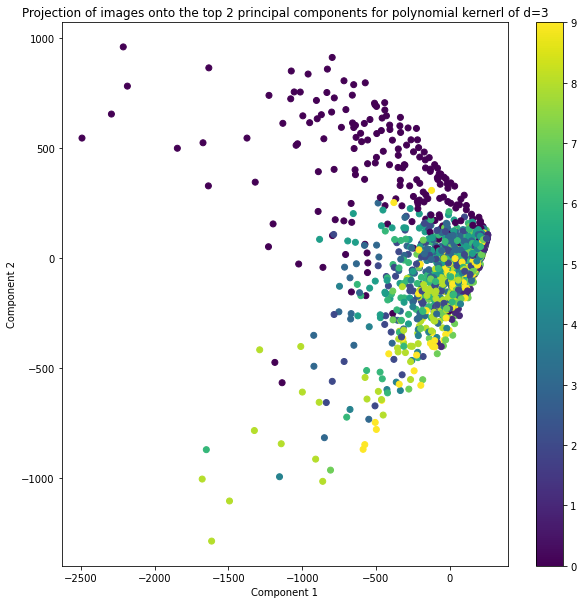

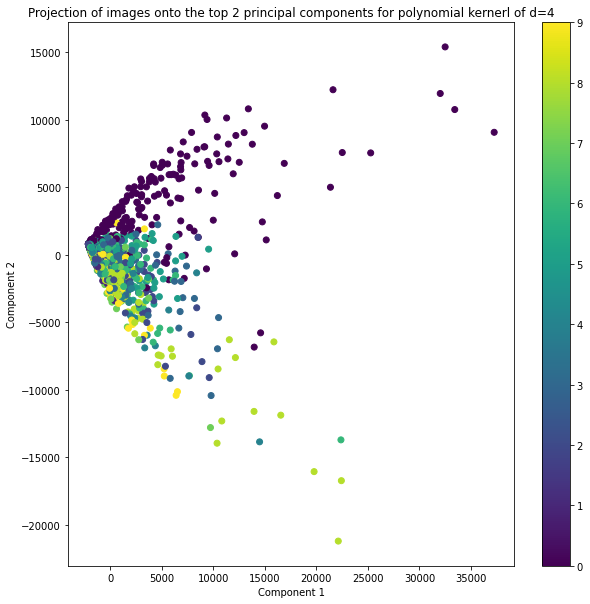

In [ ]:
D=[2,3,4]
for d in D:
  eigVal,eigVec,K=kernelPCA(xtx,kernel_1,d)
  a1=eigVec[:,0]/np.sqrt(eigVal[0])
  a2=eigVec[:,1]/np.sqrt(eigVal[1])
  x=K.dot(a1.reshape(-1,1))
  y=K.dot(a2.reshape(-1,1))
  plt.figure(figsize=(10,10))
  plt.scatter(x,y,c=c,cmap='viridis')
  plt.colorbar()
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
  plt.title(f"Projection of images onto the top 2 principal components for polynomial kernerl of d={d}")
  plt.show()

/usr/local/lib/python3.8/dist-packages/matplotlib/collections.py:196: ComplexWarning: Casting complex values to real discards the imaginary part
  offsets = np.asanyarray(offsets, float)


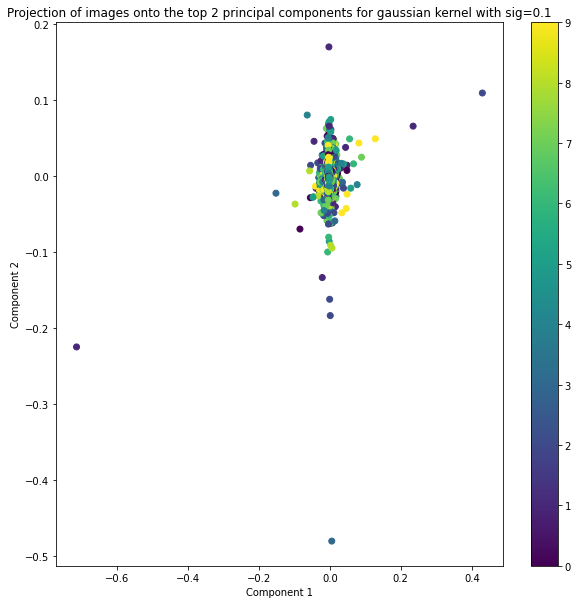

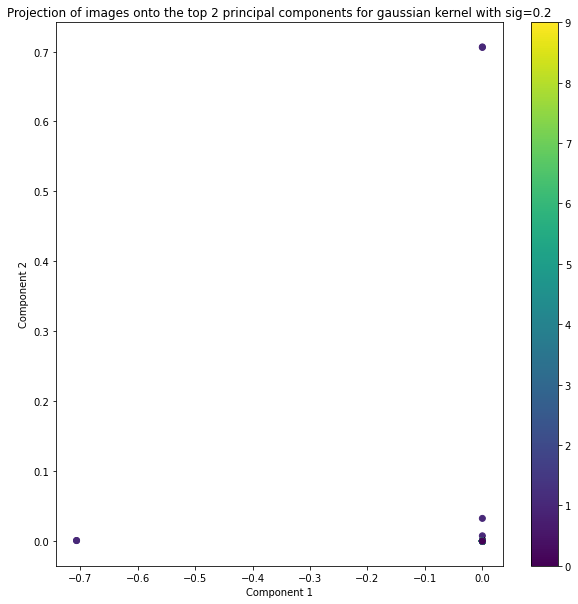

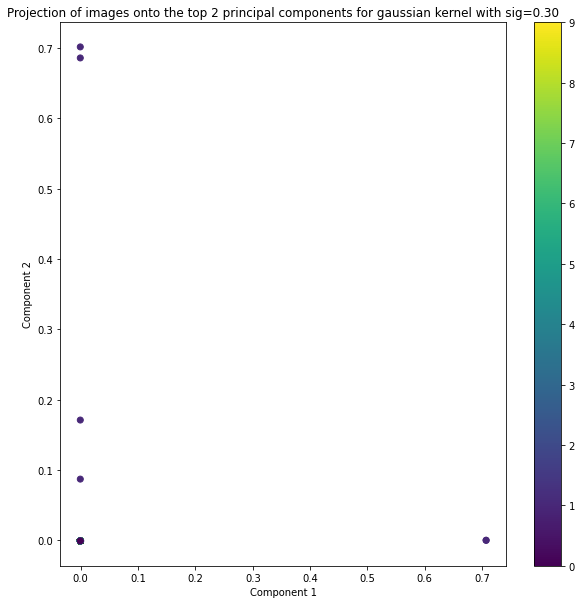

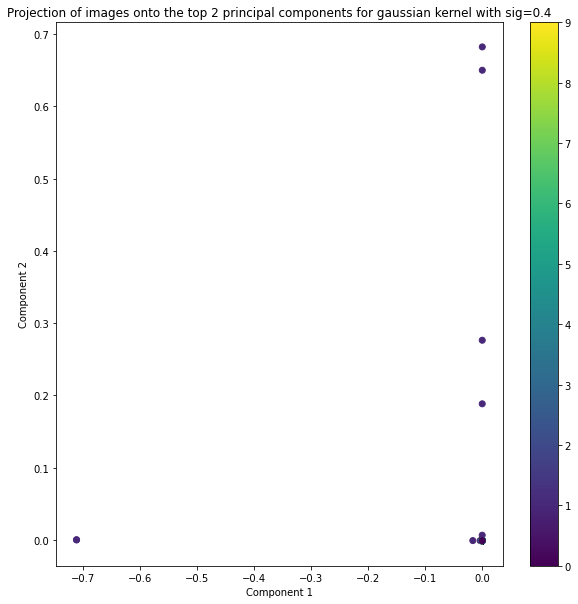

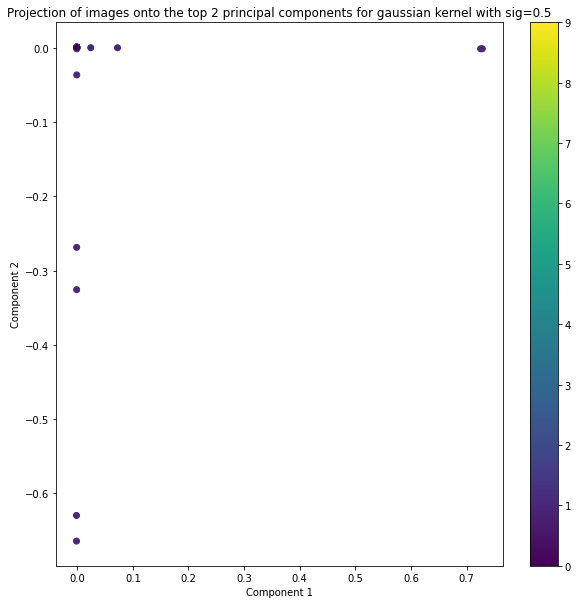

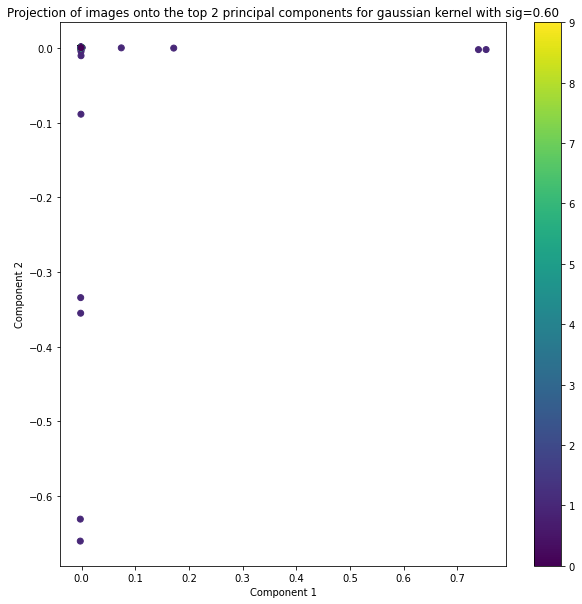

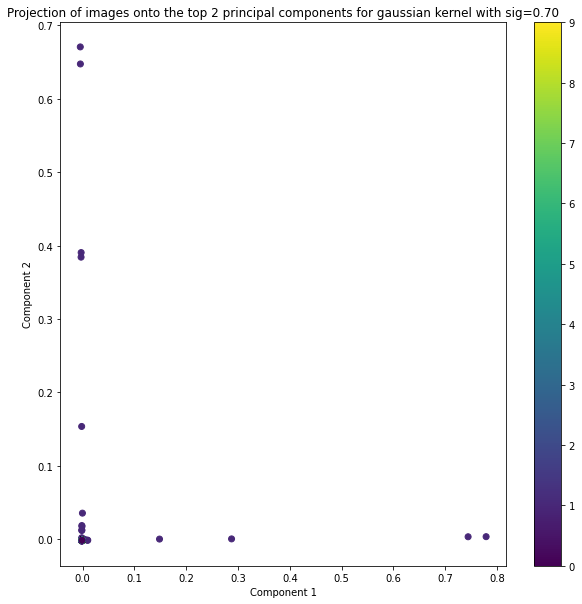

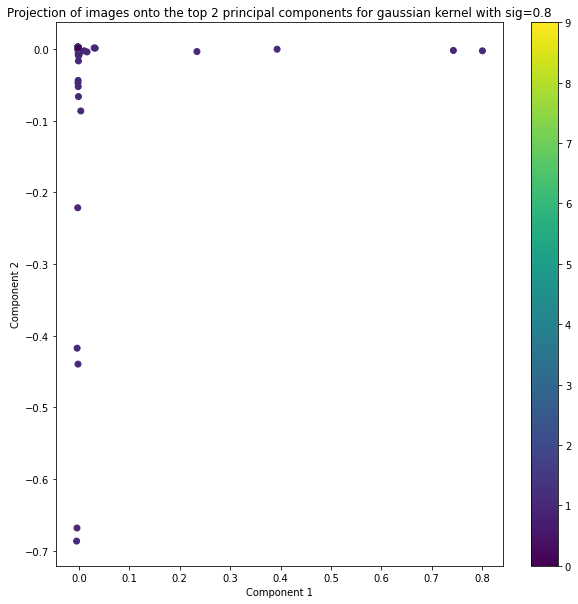

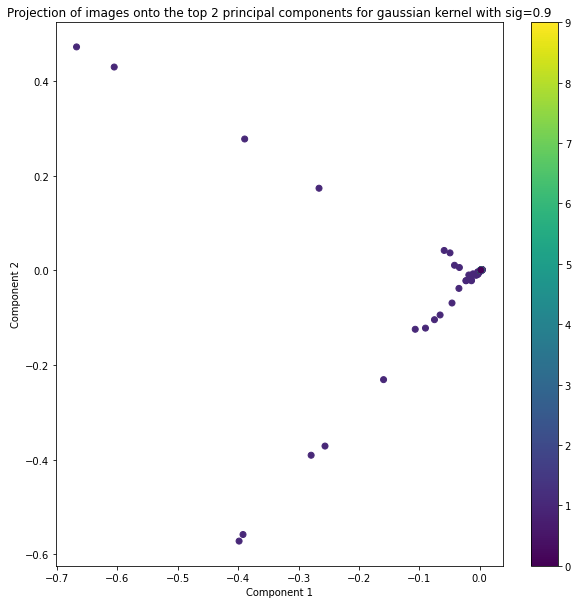

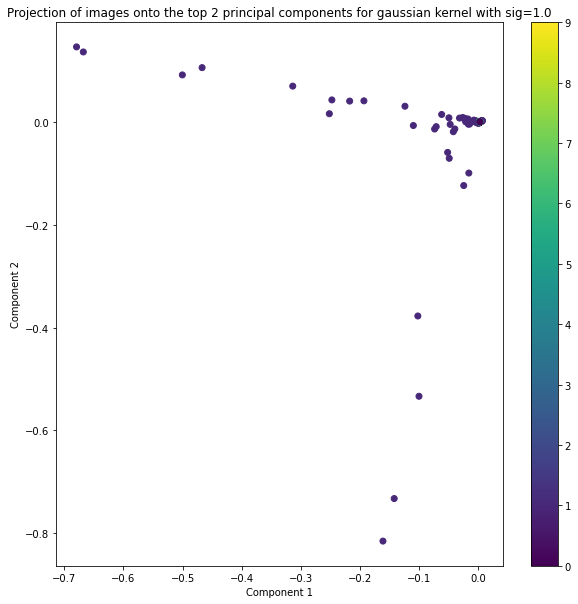

In [ ]:
sigs=list(range(1,11))
for sig in sigs:
  eigVal,eigVec,K=kernelPCA(xtx,kernel_2,sig*0.1)
  a1=eigVec[:,0]/np.sqrt(eigVal[0])
  a2=eigVec[:,1]/np.sqrt(eigVal[1])
  x=K.dot(a1)
  y=K.dot(a2)
  plt.figure(figsize=(10,10))
  plt.scatter(x,y,c=c,cmap='viridis')
  plt.colorbar()
  plt.xlabel("Component 1")
  plt.ylabel("Component 2")
  plt.title(f"Projection of images onto the top 2 principal components for gaussian kernel with sig={str(sig*0.1)[:4]}")
  plt.show()

#K-Means

In [3]:
import pandas as pd
data=pd.read_csv("/content/cm_dataset_2.csv",header=None)
data.head()

,0,1
0,-1.2061,-2.52680
1,-3.7038,0.33831
2,4.3444,0.96302
3,3.3614,2.94250
4,4.1175,2.15120


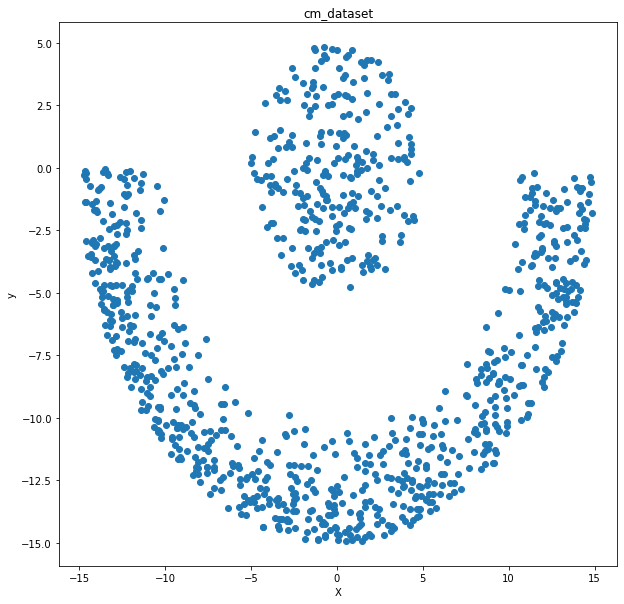

In [4]:
plt.figure(figsize=(10,10))
plt.scatter(data.iloc[:,0],data.iloc[:,1])
plt.xlabel("X")
plt.ylabel("y")
plt.title("cm_dataset")
plt.show()

In [5]:
points=data.to_numpy()

**2(i)**

In [6]:
def randomInitialization(points,k,init="rand"):
  centers=[]
  if(init=="rand"): 
    centers=random.sample(list(np.unique(points,axis=0)),k)
  if(init=="kmeans++"):
    centers.append(random.choice(points))
    for i in range(k-1):
      p=[min([distance(point,center) for center in centers]) for point in points]
      centers.append(random.choices(points,p,k=1)[0])
  return centers
def distance(p1,p2):
  return math.dist(p1,p2)
def initialClustering(points,k,init="rand"):
  centers=randomInitialization(points,k,init)
  clusters={}
  for i in range(k):
    clusters[i]=[]
  for i,point in enumerate(points):
    dist=[]
    for j in centers:
      dist.append(distance(point,j))
    clusters[np.argmin(dist)].append(i)
  return centers,clusters

def computeError(points,clusters,centers):
  error=0
  for (i,center) in enumerate(centers):
    for point in clusters[i]:
      error+=distance(points[point],center)
  return error
def recomputeCenters(points,clusters):
  centers=[]
  for i in clusters:
    n=len(clusters[i])
    center=0
    for point in clusters[i]:
      center+=np.array(points[point])
    centers.append(center/n)
  return centers
def reassignment(points,centers):
  clusters={}
  for i in range(len(centers)):
    clusters[i]=[]
  for i,point in enumerate(points):
    dist=[]
    for j in centers:
      dist.append(distance(point,j))
    clusters[np.argmin(dist)].append(i)
  return clusters
def Kmeans(points,k,init="None",perform=5):
  #performing this once was not giving very good results but was converging fast
  #so thought of running this in a loop of about 5 times and giving the best one of those based on error values
  #the perform parameter can be chosen to get the best possible fit possible. 
  C=[]
  E_all=[]
  E=[]
  for i in range(perform):
    centers,c1=initialClustering(points,k,init)
    Errors=[]
    Errors.append(computeError(points,c1,centers))
    centers=recomputeCenters(points,c1)
    c2=reassignment(points,centers)
    while(c1!=c2): #runs till convergence i.e, everypoint is where it was earlier even after reassignment
      c1=c2
      Errors.append(computeError(points,c1,centers))
      centers=recomputeCenters(points,c1)
      c2=reassignment(points,centers)
    C.append(c2)
    E_all.append(Errors)
    E.append(Errors[-1])
  idx=np.argmin(E)
  return E_all[idx],C[idx],E

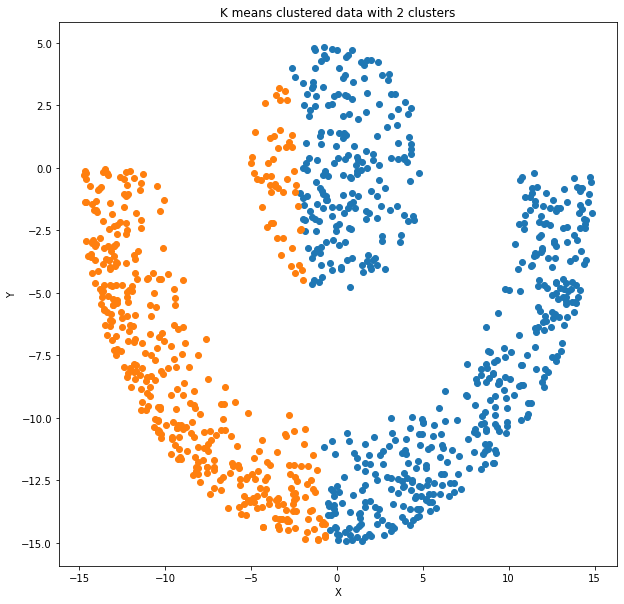

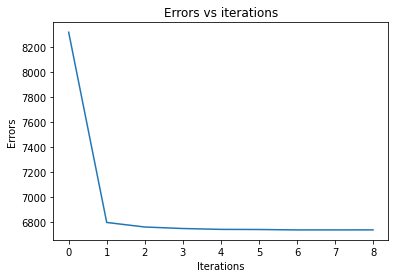

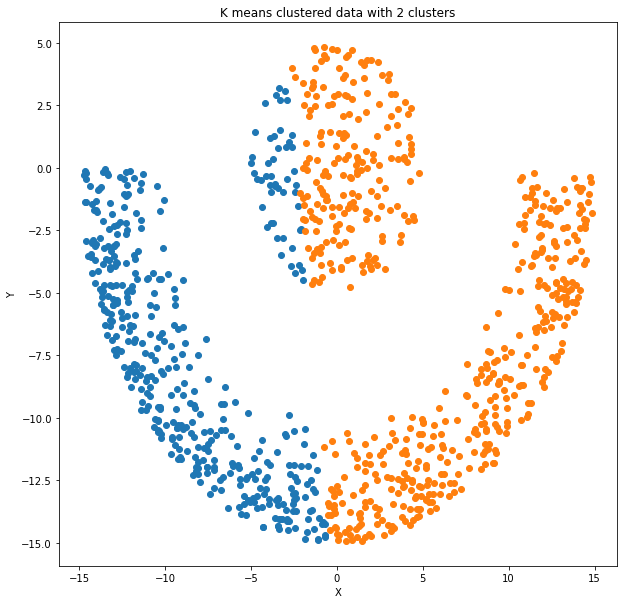

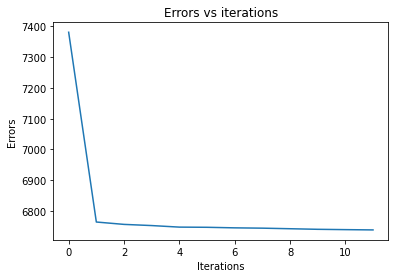

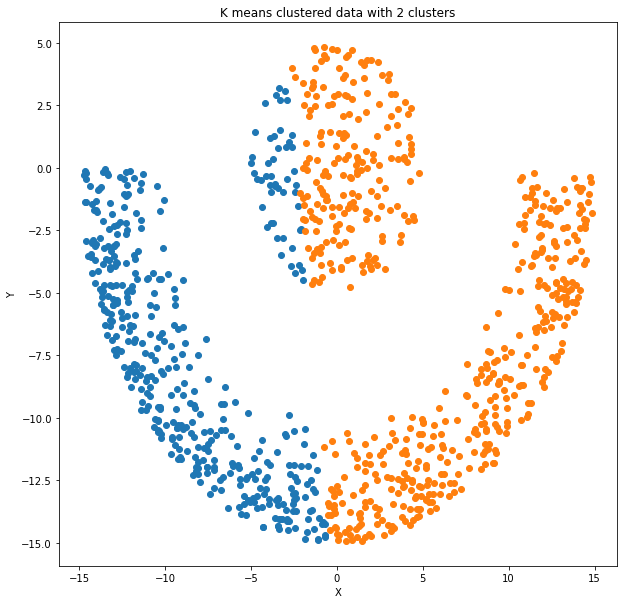

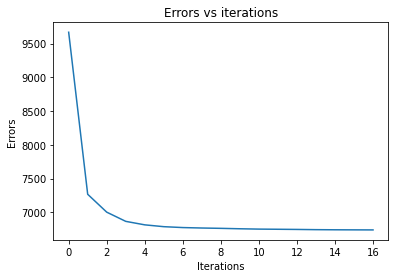

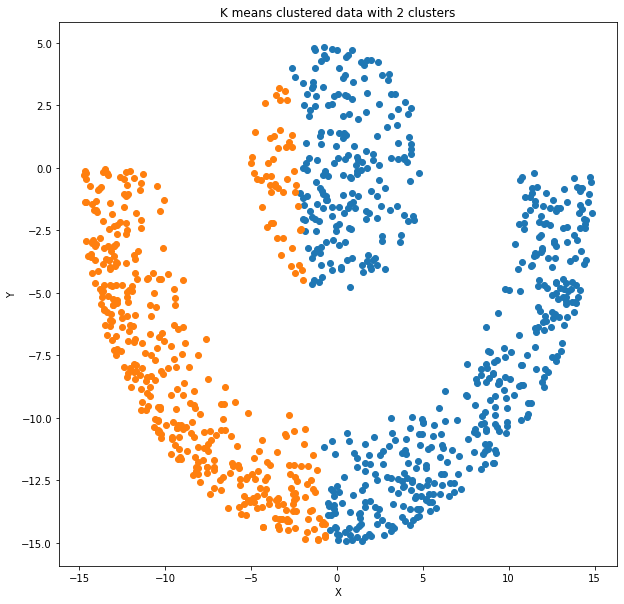

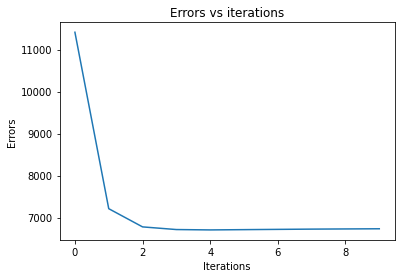

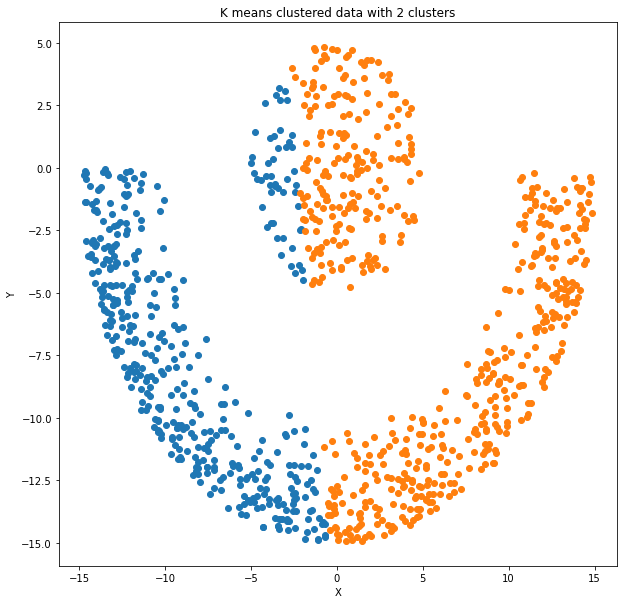

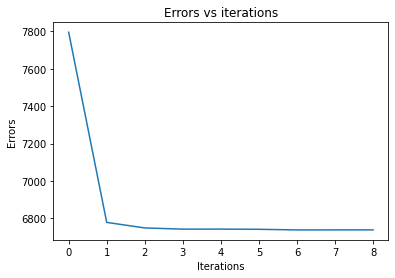

In [7]:
#Kmeans for 5 random initializations
K=2
runs=5
for i in range(runs):
  errors,clusters,E=Kmeans(points,K,init="rand",perform=1)
  plt.figure(figsize=(10,10))
  plt.xlabel("X")
  plt.ylabel("Y")
  plt.title(f"K means clustered data with {K} clusters")
  for i in clusters:
    p=clusters[i]
    plt.scatter(points[p,0],points[p,1])
  print()
  plt.figure()
  plt.plot(range(len(errors)),errors)
  plt.xlabel("Iterations")
  plt.ylabel("Errors")
  plt.title("Errors vs iterations")
  plt.show()

**2(ii)**

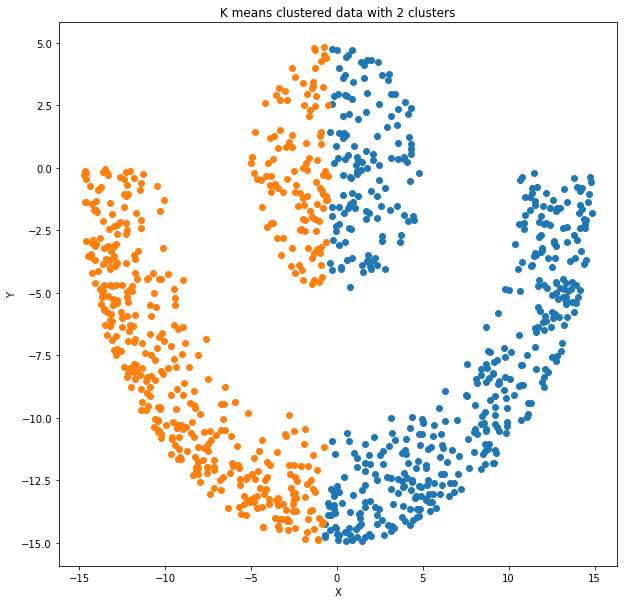

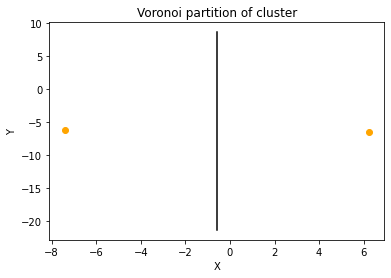

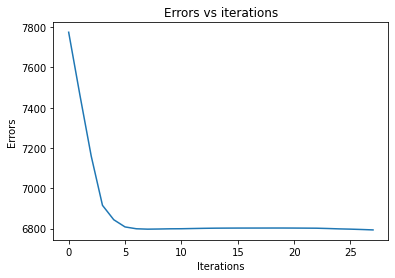

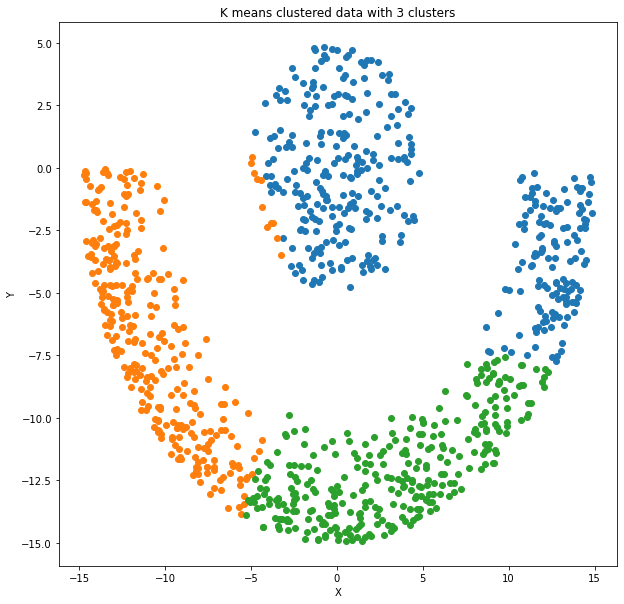

<Figure size 432x288 with 0 Axes>

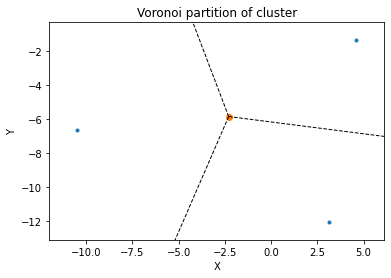

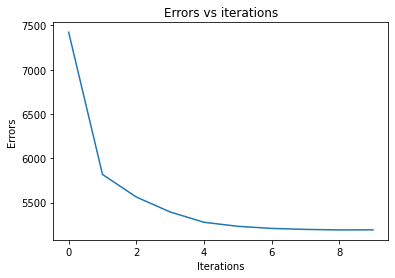

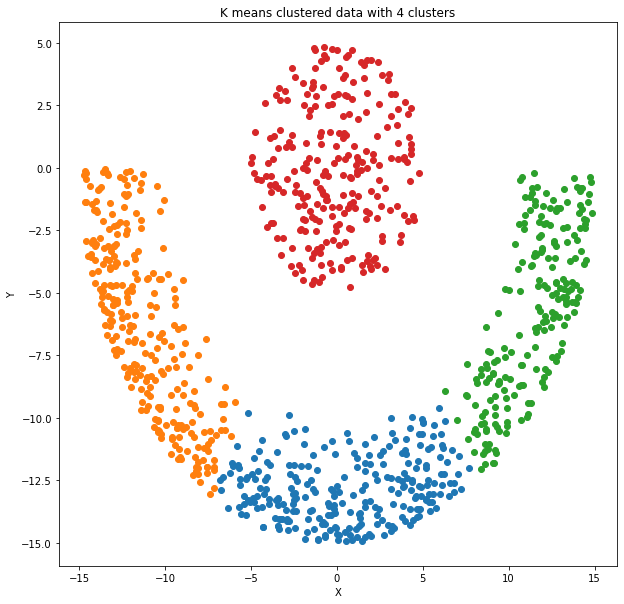

<Figure size 432x288 with 0 Axes>

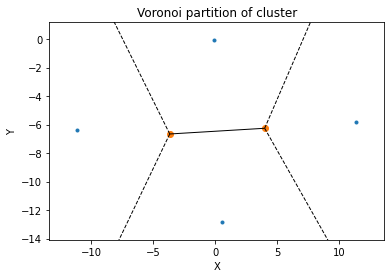

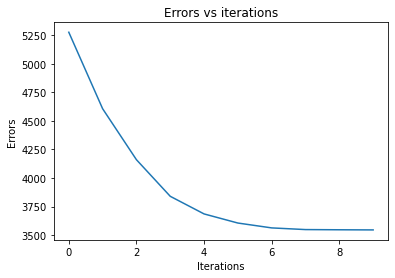

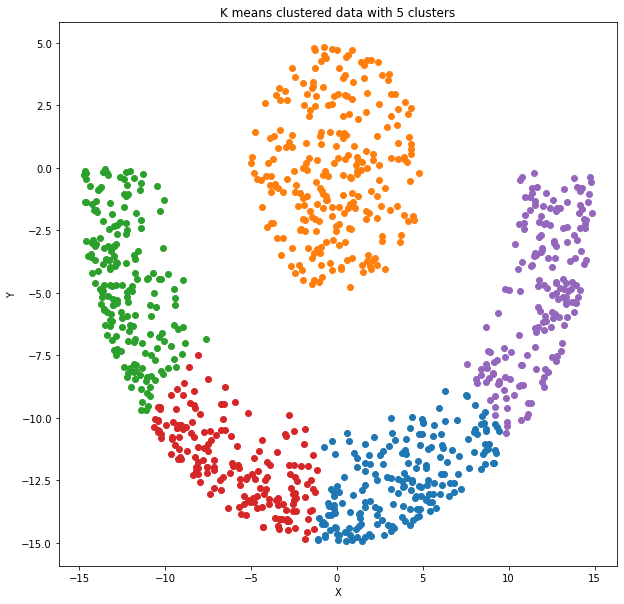

<Figure size 432x288 with 0 Axes>

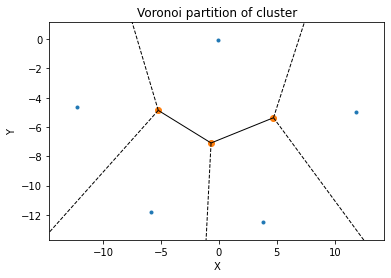

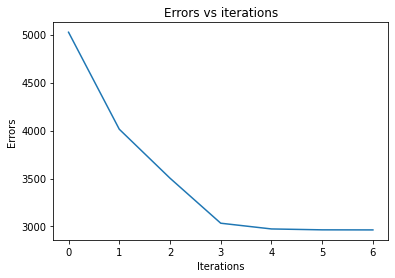

In [8]:
#Different number of clusters for a fixed initialization
#Kmeans for 5 random initializations
K={2,3,4,5}
runs=5
for k in K:
  errors,clusters,E=Kmeans(points,k,init="rand",perform=1)
  plt.figure(figsize=(10,10))
  plt.xlabel("X")
  plt.ylabel("Y")
  plt.title(f"K means clustered data with {k} clusters")
  for i in clusters:
    p=clusters[i]
    plt.scatter(points[p,0],points[p,1])
  print()
  if(k==2):
    plt.figure()
    centers=recomputeCenters(points,clusters)
    center=(centers[0]+centers[1])/2
    plt.scatter(centers[0][0],centers[0][1],color='orange')
    plt.scatter(centers[1][0],centers[1][1],color='orange')
    plt.plot([center[0],center[0],center[0]],[center[1]-15,center[1],center[1]+15],color='black')
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Voronoi partition of cluster")
  if(k>2):
    plt.figure()
    centers=recomputeCenters(points,clusters)
    vor = Voronoi(centers)
    fig = voronoi_plot_2d(vor)
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("Voronoi partition of cluster")
  plt.figure()
  plt.plot(range(len(errors)),errors)
  plt.xlabel("Iterations")
  plt.ylabel("Errors")
  plt.title("Errors vs iterations")
  plt.show()


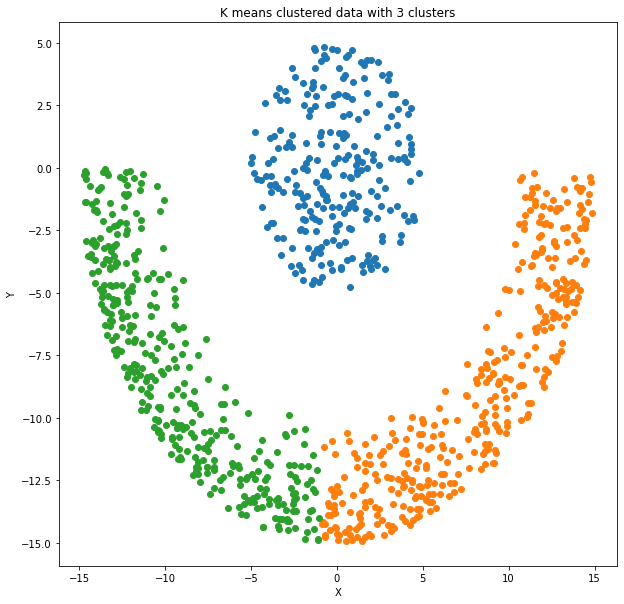

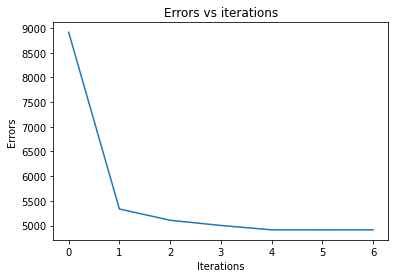

In [9]:
#A general declaration of the function:
K=3
errors,clusters,E=Kmeans(points,K,init="rand",perform=5) # points -> data , k -> # clusters  init rand / kmeans++ , perform -> best of #
#errors if a list of errors computed after every reassignment
#clusters is a dictionary of cluster number and points in that cluster
plt.figure(figsize=(10,10))
plt.xlabel("X")
plt.ylabel("Y")
plt.title(f"K means clustered data with {K} clusters")
for i in clusters:
  p=clusters[i]
  plt.scatter(points[p,0],points[p,1])
print()
plt.figure()
plt.plot(range(len(errors)),errors)
plt.xlabel("Iterations")
plt.ylabel("Errors")
plt.title("Errors vs iterations")
plt.show()

# Spectral Clustering

**2(iii)**

In [10]:
#same kernels from the previous question
#intial assumption: as i saw the plot of data and it seems a quadratic kernel would be enough
def kernel_1(x,y,d):
  return (x.dot(y)+1.)**d
def kernel_2(x,y,sig):
  return np.exp(-(distance(x,y)**2/(2.*sig**2)))
def compute_K(points,kernel,param):
  N,D=points.shape
  K=np.zeros(shape=(N,N))
  for i in range(N):
    for j in range(i,N):
      prod=kernel(points[i],points[j],param)
      K[i][j]=prod
      K[j][i]=prod
  return K
def get_H(K,k):
  eigVal,eigVec=la.eig(K)
  sortedIndices=eigVal.argsort()[::-1]
  eigenValsSorted=eigVal[sortedIndices]
  eigenVectorsSorted=eigVec[:,sortedIndices]
  return eigenVectorsSorted[:,:k]
def rowNormalization(H):
  H_norm=np.zeros_like(H)
  for i,row in enumerate(H):
    if row.dot(row)!=0:
      #H_norm[i]=row/(row.dot(row)) # this normalization is not how we are supposed to normalize it but it seems to work for this
      H_norm[i]=row/np.sqrt((row.dot(row))) # this is whati was supposed to use but it was not giving proper results
  return H_norm
def spectralKmeans(points,k,kernel,param,init="kmeans++",perform=5):
  K=compute_K(points,kernel,param)
  H=get_H(K,k)
  H_norm=rowNormalization(H)
  return Kmeans(H_norm,k,init,perform),H_norm



<ipython-input-6-6142ab9fa482>:12: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.dist(p1,p2)


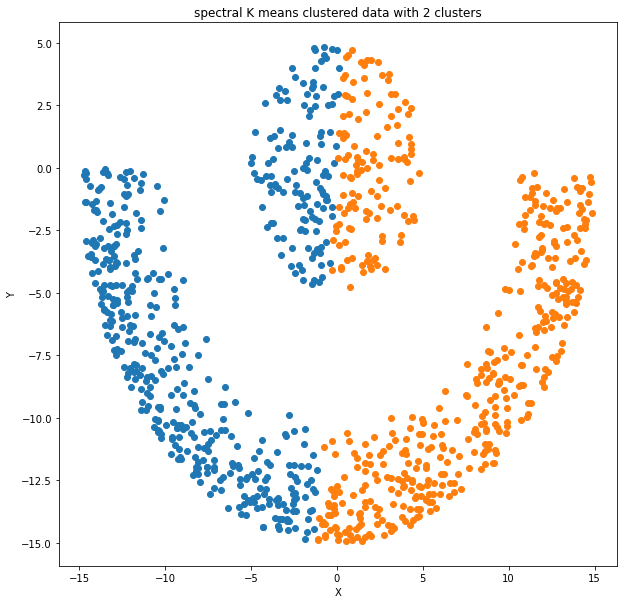

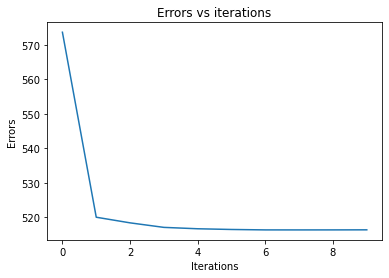

In [11]:
#A general declaration of the function:
k=2
(errors,clusters,E),H=spectralKmeans(points,k,kernel_1,1,perform=5) # points -> data , k -> # clusters  init rand / kmeans++ , perform -> best of #
#errors if a list of errors computed after every reassignment
#clusters is a dictionary of cluster number and points in that cluster
plt.figure(figsize=(10,10))
plt.xlabel("X")
plt.ylabel("Y")
plt.title(f"spectral K means clustered data with {k} clusters")
for i in clusters:
  p=clusters[i]
  plt.scatter(points[p,0],points[p,1])
print()
plt.figure()
plt.plot(range(len(errors)),errors)
plt.xlabel("Iterations")
plt.ylabel("Errors")
plt.title("Errors vs iterations")
plt.show()

<ipython-input-6-6142ab9fa482>:12: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.dist(p1,p2)


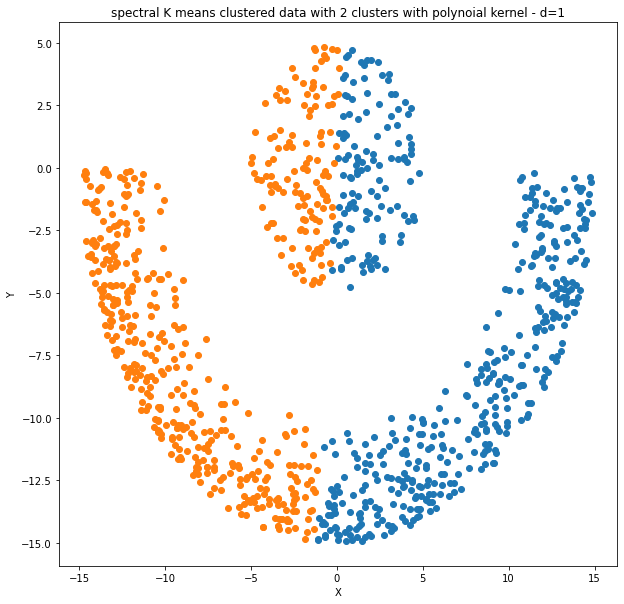

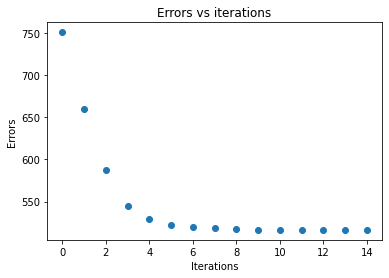

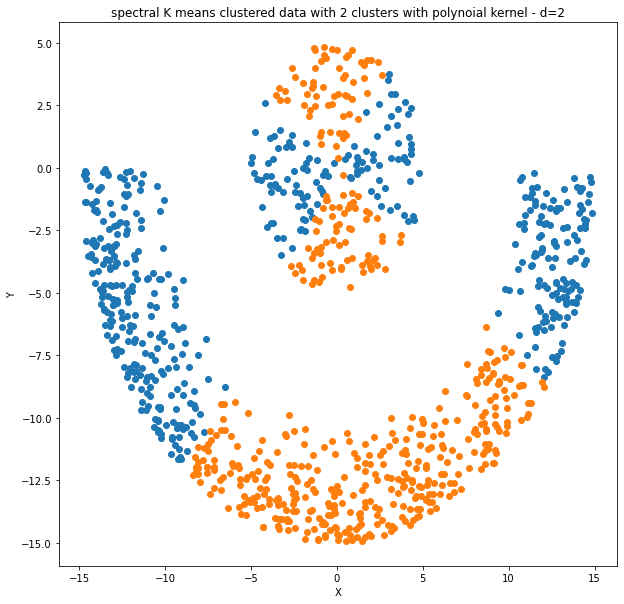

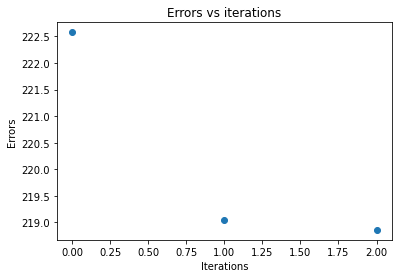

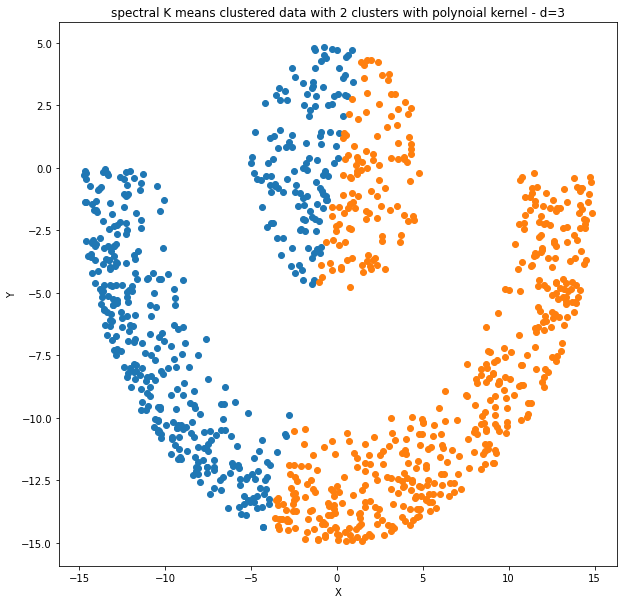

...

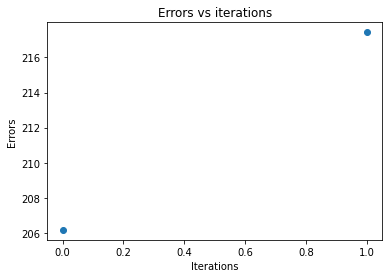

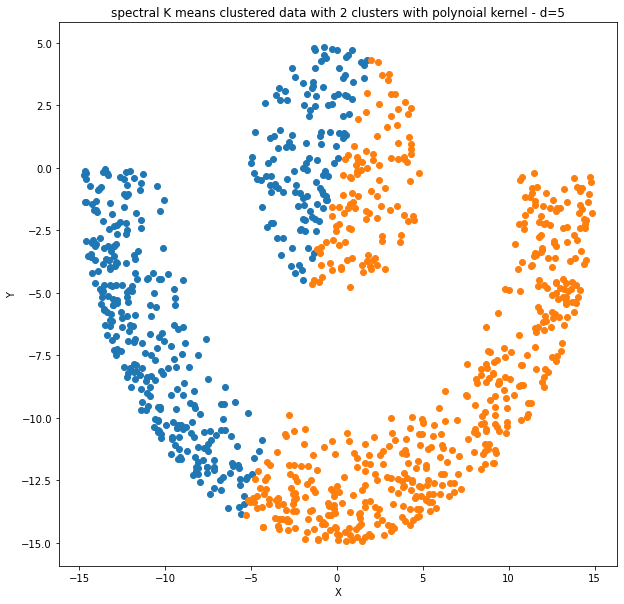

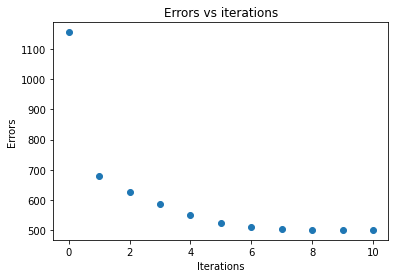

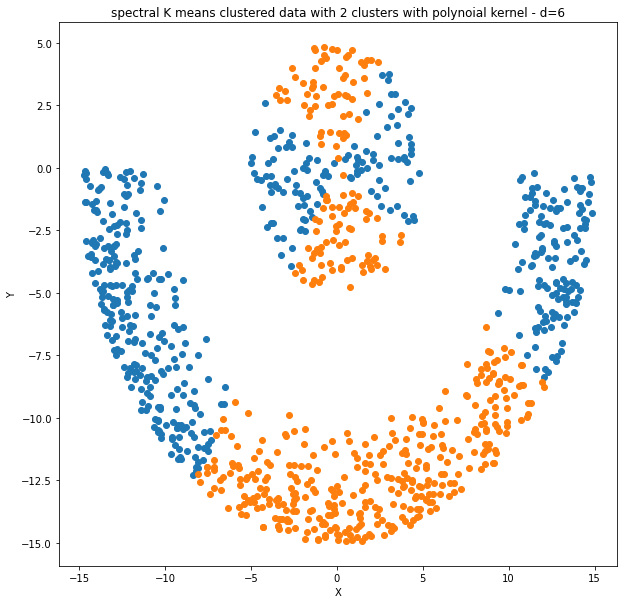

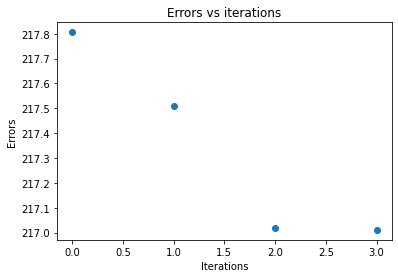

In [12]:
#Trying out the polynomial kernel for few values of d
D=[1,2,3,4,5,6]
k=2
for d in D:
  (errors,clusters,E),H=spectralKmeans(points,k,kernel_1,d,perform=5) # points -> data , k -> # clusters  init rand / kmeans++ , perform -> best of #
  #errors if a list of errors computed after every reassignment
  #clusters is a dictionary of cluster number and points in that cluster
  plt.figure(figsize=(10,10))
  plt.xlabel("X")
  plt.ylabel("Y")
  plt.title(f"spectral K means clustered data with {k} clusters with polynoial kernel - d={d}")
  for i in clusters:
    p=clusters[i]
    plt.scatter(points[p,0],points[p,1])
  print()
  plt.figure()
  plt.scatter(range(len(errors)),errors)
  plt.xlabel("Iterations")
  plt.ylabel("Errors")
  plt.title("Errors vs iterations")
  plt.show()

Looking at the above plots its seems like **polynmial kernel** is not the best suited kernel for the job as the results are not in the way we want it to be. For the given dataset polynomial does not seem to be working. For lower values of d there seems to be some amount form of seperation/clustering in the new dimensions it is generating but it is not seperating in 2D as we want it to seperate

**Note**:  the error plots are errors for the eigen vector data and not the original data. 

<ipython-input-6-6142ab9fa482>:12: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.dist(p1,p2)


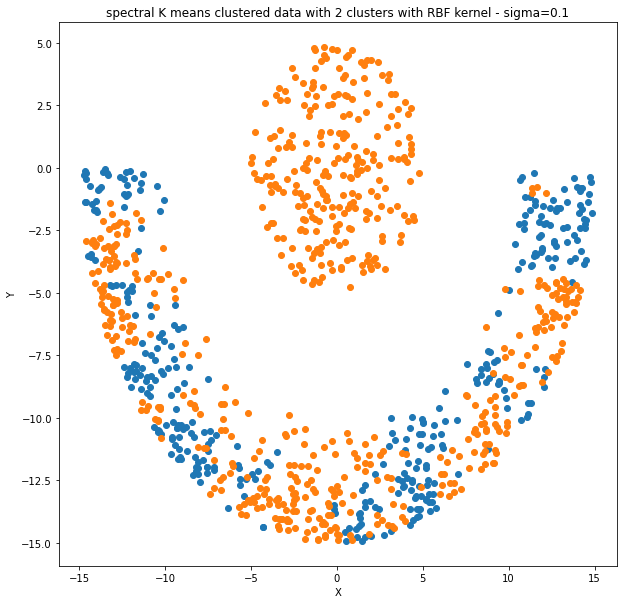

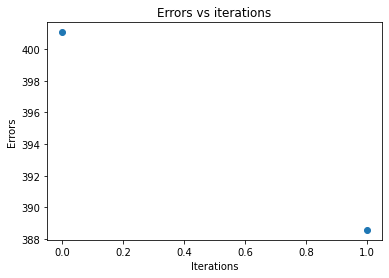

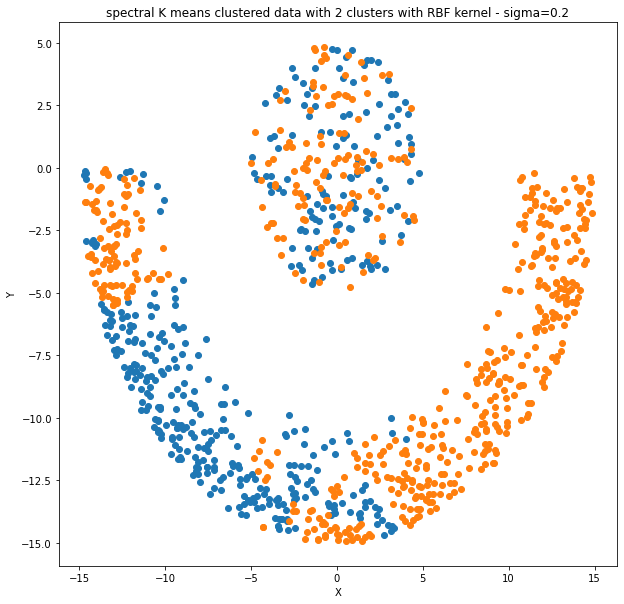

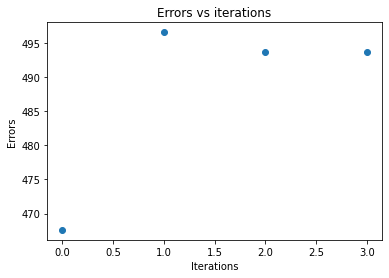

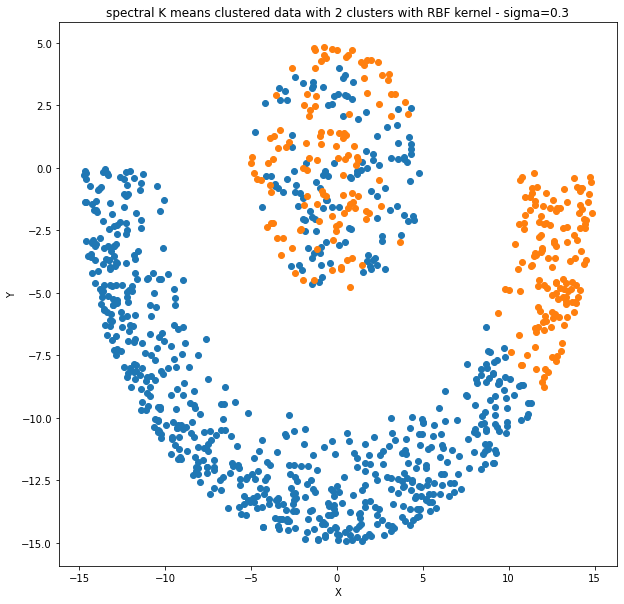

...

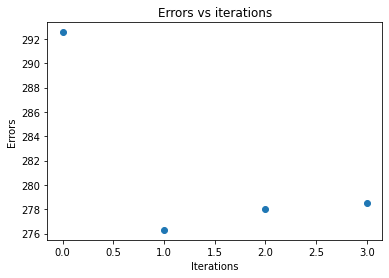

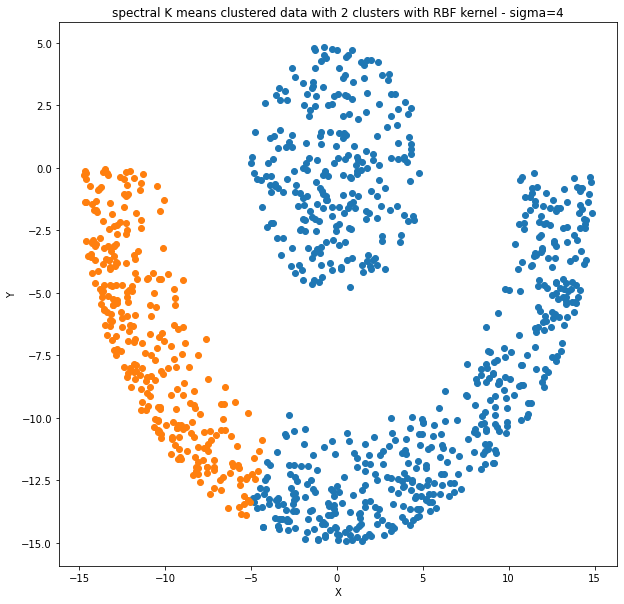

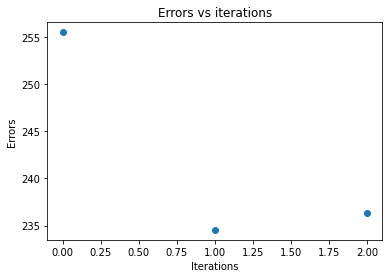

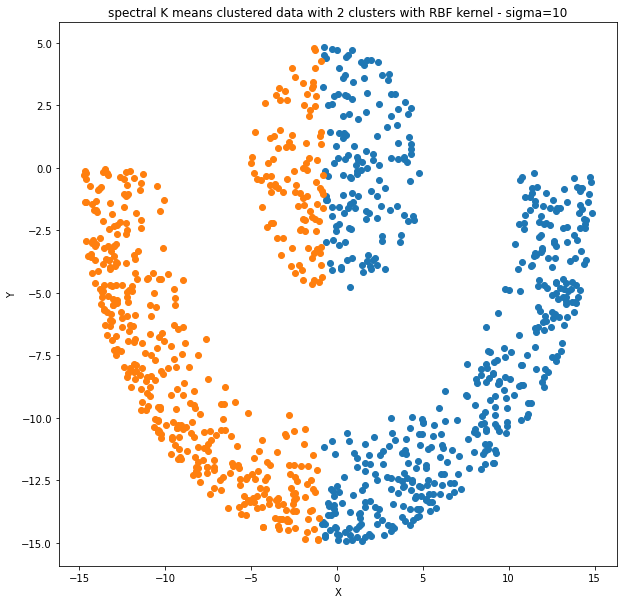

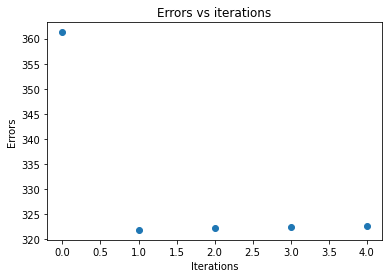

In [13]:
#Trying out the polynomial kernel for few values of d
sigs=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,10]
k=2
for sig in sigs:
  (errors,clusters,E),H=spectralKmeans(points,k,kernel_2,sig,perform=5) # points -> data , k -> # clusters  init rand / kmeans++ , perform -> best of #
  #errors if a list of errors computed after every reassignment
  #clusters is a dictionary of cluster number and points in that cluster
  plt.figure(figsize=(10,10))
  plt.xlabel("X")
  plt.ylabel("Y")
  plt.title(f"spectral K means clustered data with {k} clusters with RBF kernel - sigma={sig}")
  for i in clusters:
    p=clusters[i]
    plt.scatter(points[p,0],points[p,1])
  print()
  plt.figure()
  plt.scatter(range(len(errors)),errors)
  plt.xlabel("Iterations")
  plt.ylabel("Errors")
  plt.title("Errors vs iterations")
  plt.show()

The above results obtained by using RBF kernel do not seem encouraging. Although for smaller values of sigma it seems like it might converge we do not know for what exact value of sigma will it converge. And trail and error would not take you so far. 

Lets try using a different kernel.

In [14]:
def kernel_3(x,y,d,sig):
  return kernel_1(x,y,d) + kernel_2(x,y,sig)
def compute_K(points,kernel,d,sig):
  N,D=points.shape
  K=np.zeros(shape=(N,N))
  for i in range(N):
    for j in range(i,N):
      prod=kernel(points[i],points[j],d,sig)
      K[i][j]=prod
      K[j][i]=prod
  return K
def get_H(K,k):
  eigVal,eigVec=la.eig(K)
  sortedIndices=eigVal.argsort()[::-1]
  eigenValsSorted=eigVal[sortedIndices]
  eigenVectorsSorted=eigVec[:,sortedIndices]
  return eigenVectorsSorted[:,:k]
def rowNormalization(H):
  H_norm=np.zeros_like(H)
  for i,row in enumerate(H):
    if row.dot(row)!=0:
      #H_norm[i]=row/(row.dot(row)) # this normalization is not how we are supposed to normalize it but it seems to work for this
      H_norm[i]=row/np.sqrt((row.dot(row))) # this is whati was supposed to use but it was not giving proper results
  return H_norm
def spectralKmeans(points,k,kernel,d=2,sig=0.1,init="kmeans++",perform=5):
  K=compute_K(points,kernel,d,sig)
  H=get_H(K,k)
  H_norm=rowNormalization(H)
  return Kmeans(H_norm,k,init,perform),H_norm



<ipython-input-6-6142ab9fa482>:12: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.dist(p1,p2)


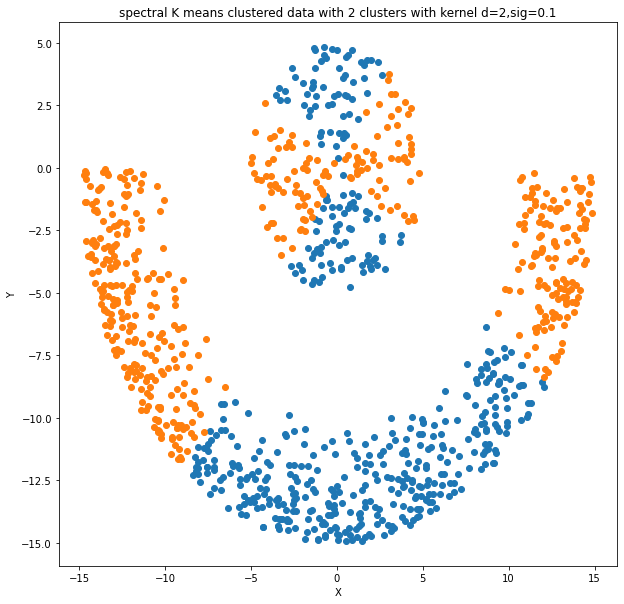

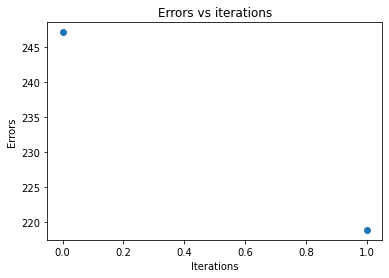

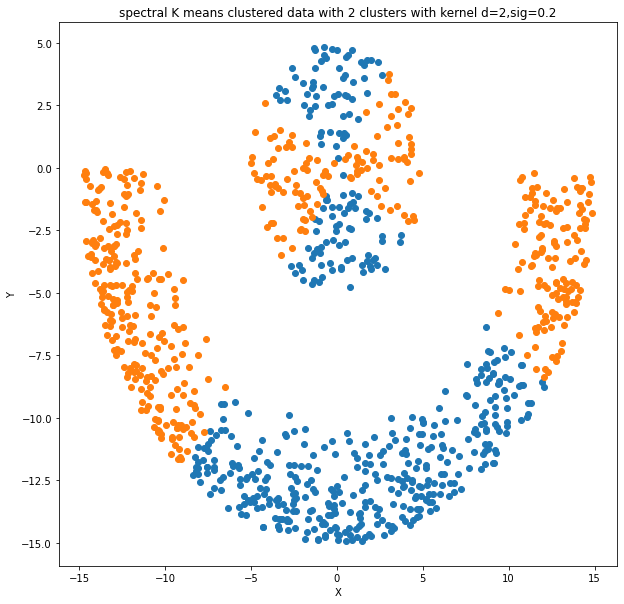

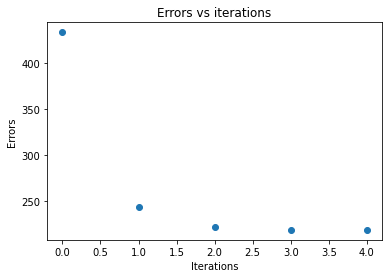

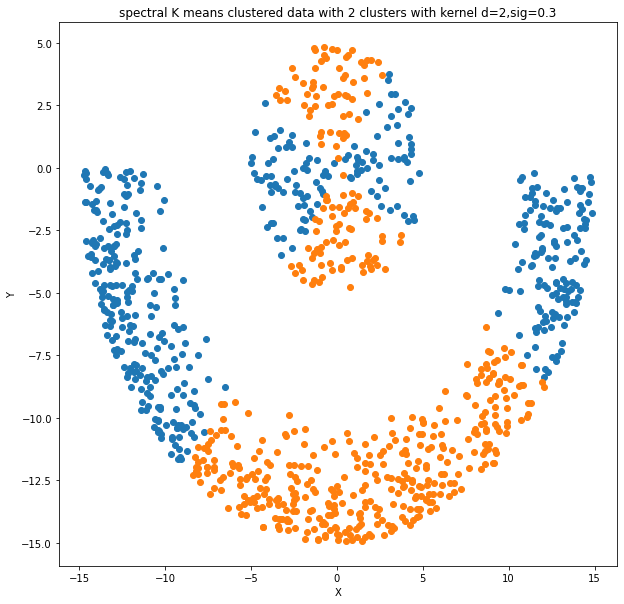

...

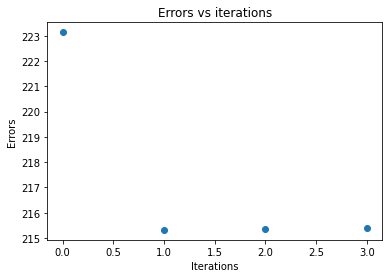

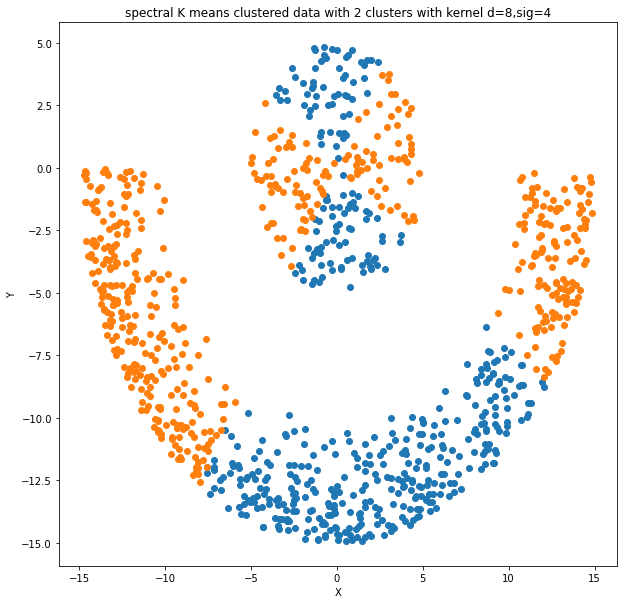

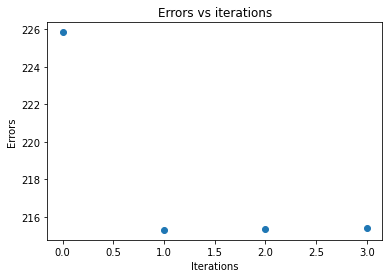

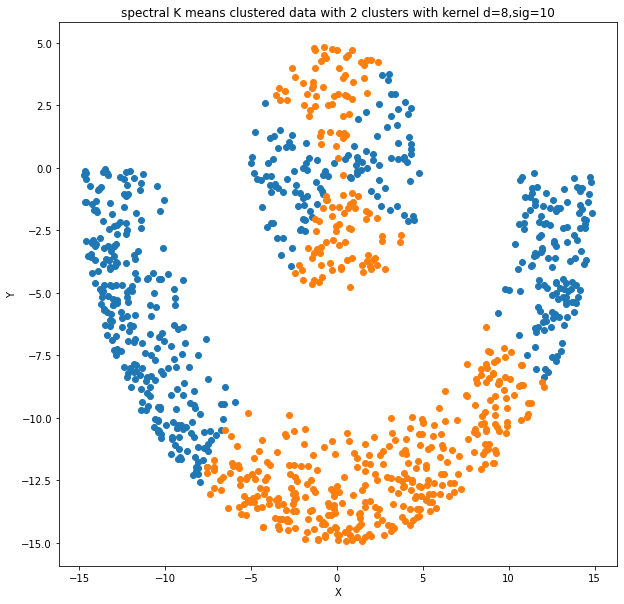

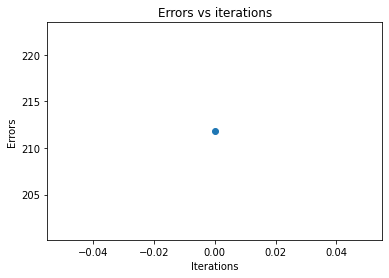

In [15]:
#Trying out the polynomial kernel for few values of d
sigs=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1,2,3,4,10]
D=[2,3,4,5,6,7,8]
k=2
for d in D:
 for sig in sigs:
  (errors,clusters,E),H=spectralKmeans(points,k,kernel_3,d,sig,perform=5) # points -> data , k -> # clusters  init rand / kmeans++ , perform -> best of #
  #errors if a list of errors computed after every reassignment
  #clusters is a dictionary of cluster number and points in that cluster
  plt.figure(figsize=(10,10))
  plt.xlabel("X")
  plt.ylabel("Y")
  plt.title(f"spectral K means clustered data with {k} clusters with kernel d={d},sig={sig}")
  for i in clusters:
    p=clusters[i]
    plt.scatter(points[p,0],points[p,1])
  print()
  plt.figure()
  plt.scatter(range(len(errors)),errors)
  plt.xlabel("Iterations")
  plt.ylabel("Errors")
  plt.title("Errors vs iterations")
  plt.show()

**2(iv)**

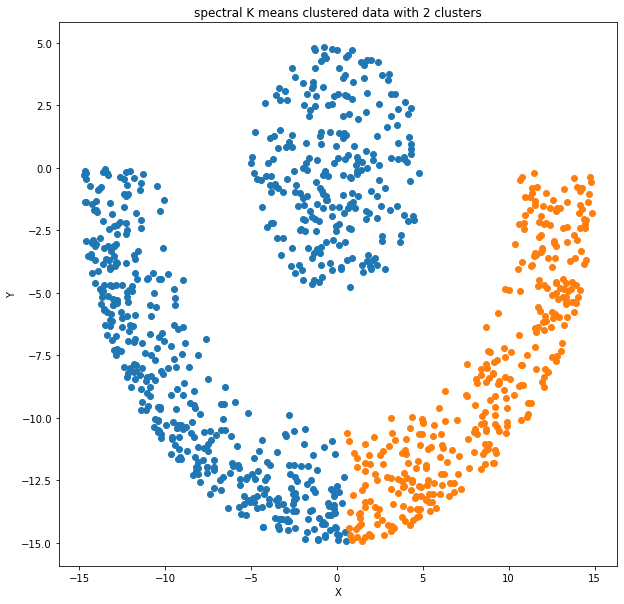

In [ ]:
assignment=np.argmax(H,axis=1)
cluster_maxed={}
for i,z in enumerate(assignment):
  if z not in cluster_maxed:
    cluster_maxed[z]=[]
    cluster_maxed[z].append(i)
  else:
    cluster_maxed[z].append(i)
plt.figure(figsize=(10,10))
plt.xlabel("X")
plt.ylabel("Y")
plt.title(f"spectral K means clustered data with {k} clusters")
for i in cluster_maxed:
  p=cluster_maxed[i]
  plt.scatter(points[p,0],points[p,1])

The method where we chose the argmax of the row as its cluster does not seem to work as well. I believe this has got to do with both the choice of kernel and the dateset we have. The dataset we have cannot be seperable using either of the kernels. 

The spectral clustering method that I have tried above does not seem to be working. The result i have shown was obtained do not suggest that the method is working. It is either the fault in the method itself or with the choice of kernel. 


The only way to see which kernel works is to try a whole lot of kernels which is time consuming and does not garuntee good results. But a change in method it self could help.


A way around: 
To obtain a proper clustering I chose to follow the algorithm stated in the paper **On Spectral Clustering: Analysis and an algorithm** 
by Andrew N G

We will implement this and look the result

After running the bottom code and unserstanding the working of it i realise that the process we are following is correct just that we need to add one more sted that is to normalise the $A$ matrix also

**2(iii)** *with a different algorithm for spectral clustering*








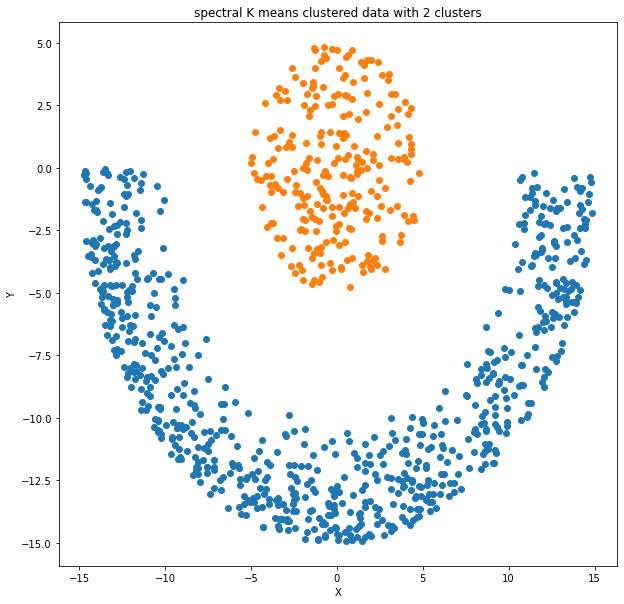

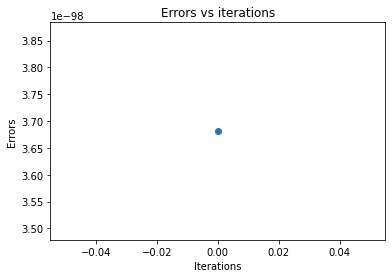

In [23]:
def kernel_1(x,y,d):
  return (x.dot(y)+1.)**d
def kernel_2(x,y,sig):
  return np.exp(-(distance(x,y)**2/(2.*sig**2)))
def affinityMatrix(points,kernel,param):
  """
  Returns a kernel matrix
  """
  N,D=points.shape
  A=np.zeros((N,N))
  for i in range(N):
    for j in range(i+1,N):
      prod=kernel(points[i],points[j],param)
      A[i][j]=prod
      A[j][i]=prod
  return A
def laplacian(A):
  rowSum=np.sum(A,axis=1)**(-0.5)
  D=np.diag(rowSum)
  L=D.dot(A).dot(D)
  return L
def get_H(K,k):
  eigVal,eigVec=la.eig(K)
  eigVal,eigVec=np.real(eigVal),np.real(eigVec)
  sortedIndices=eigVal.argsort()[::-1]
  eigenValsSorted=eigVal[sortedIndices]
  eigenVectorsSorted=eigVec[:,sortedIndices]
  return np.real(eigenVectorsSorted[:,:k])
def rowNormalization(H):
  H_norm=np.zeros_like(H)
  for i,row in enumerate(H):
    if row.dot(row)!=0:
      #H_norm[i]=row/(row.dot(row)) # this normalization is not how we are supposed to normalize it but it seems to work for this
      H_norm[i]=row/np.sqrt((row.dot(row)))# this is whati was supposed to use but it was not giving proper results
  return H_norm

def spectralKmeans(points,k,kernel,param,init="kmeans++",perform=5):
  A=affinityMatrix(points,kernel,param)
  L=laplacian(A)
  H=get_H(L,k)
  H_norm=rowNormalization(H)
  return Kmeans(H_norm,k,init,perform),H_norm
#A general declaration of the function:
k=2
(errors,clusters,E),H=spectralKmeans(points,k,kernel_2,0.2,perform=5) # points -> data , k -> # clusters  init rand / kmeans++ , perform -> best of #
#errors if a list of errors computed after every reassignment
#clusters is a dictionary of cluster number and points in that cluster
plt.figure(figsize=(10,10))
plt.xlabel("X")
plt.ylabel("Y")
plt.title(f"spectral K means clustered data with {k} clusters")
for i in clusters:
  p=clusters[i]
  plt.scatter(points[p,0],points[p,1])
print()
plt.figure()
plt.scatter(range(len(errors)),errors)
plt.xlabel("Iterations")
plt.ylabel("Errors")
plt.title("Errors vs iterations")
plt.show()

As mentioned earlier the above algorithm was taken from the paper written by Andrew N G. The paper treats this problem in a different perspective. They treat each point as a node of a graph. The adjacency matrix for the graph is nothing but the kernel matrix which they call as affinity matrix. They also impose a rule of no self loops and hence we set $A_{ii}=0$. The edge weight ends up becoming the $K<x,x'>$ where K is the kernel function. Then they compute a Weighted Degree matrix from the adjacency matrix which is nothing but a diagonal matrix with entries sum of rows as the entries. Then they compute a laplacian of the matrix using the formula $ L=D^{-1/2} A D^{-1/2} $. Mind that this is slightly different from the original laplacian $L=I-D^{-1/2} A D^{-1/2} $ but that doesnt change the eigen vectors which are of interest to us. They they compute the eigen values of the $L$ and then take K eigen vectors corressponding to the top K eigen values and make a matrix of size $N*K$. Then after performing a row normalixation, treating each row as a new point normal k means is carried out. The clustering of the eigen vector matrix would correspond to the clustering of the original data also. 



**How is this different from out method and why is this working?**

In our method also we start by computing the adjacency matrix. But a difference is that in ours $A_{ii}=1$ insted of 0. Even when tried putting $A_{ii}=0$ we dont get appreciable results.Then we try to look a the eigen vectors of this matrix directly without computing the Laplacian. Through math it was shown in class that finding eigen vectos or A and then doing k means on the row normalised eigen matrix will give use a good clustering. But it was also stated that the H matrix we get is just a proxy. So i believe that just by computing H matrix using A was not enough we need to incorporate something more. And this job is done through computing the laplacian of the graph. Which begs the question *what does laplacian of a graph signify?* With my current knowledge I am not suited to answer this question. Rater i would answer this question from a Linear algebra point of view. The computation of L here can be view as a simple process of normalising the matrix A. Because that is what we end up doing when we compute the L. the matrix A is both row and column normalised with $D^{-1/2}$. And then using this normalised matrix we can look at the top K eigen values and the vectors and continue the job. So in conclusion the matrix A itself is not enough to compute the clusters. We would need to use a normalised version of $A$. This was done by computing $ L=D^{-1/2} A D^{-1/2} $. We could have also stated $L$ as $L=D^{-1}A$ this is also a form of laplacian that was used for spectral clustering in some other paper **"Normalized spectral clustering according to Shi and Malik (2000)"** and in this form it is easier to see that it is a normaalising step to make sum along rows 1. 

I understand that the explaination is not so apt and is not exactly what was told in the paper. But the above stated things are my opinions on why this works. 

**2(iv)** *With a different algorithm for spectral clustering*

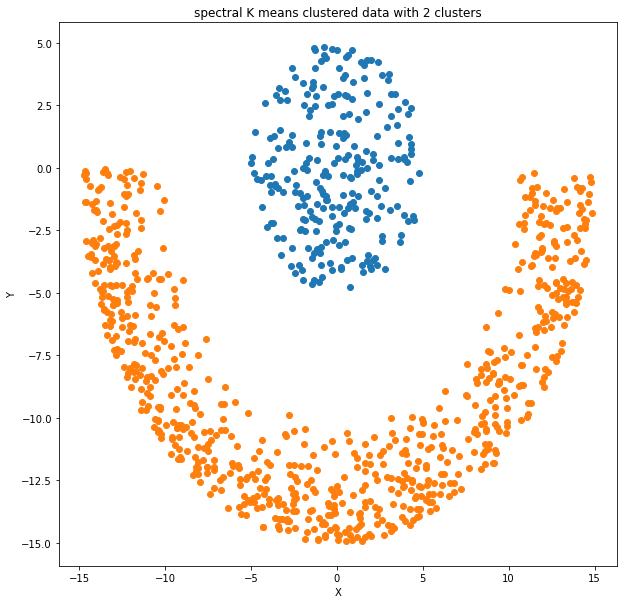

In [24]:
assignment=np.argmax(H,axis=1)
cluster_maxed={}
for i,z in enumerate(assignment):
  if z not in cluster_maxed:
    cluster_maxed[z]=[]
    cluster_maxed[z].append(i)
  else:
    cluster_maxed[z].append(i)
plt.figure(figsize=(10,10))
plt.xlabel("X")
plt.ylabel("Y")
plt.title(f"spectral K means clustered data with {k} clusters")
for i in cluster_maxed:
  p=cluster_maxed[i]
  plt.scatter(points[p,0],points[p,1])

The proxy H that we have computed using the eigen vectors is a very good procy for the original and hence has yielded the above result. This is also to some extent dataset specific. If used on a different dataset we might not get the same result. 